In [2]:
# Main Library
import os
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from skimage.feature import hog
from skimage import color, filters
from tqdm import tqdm
import imgaug.augmenters as iaa
import random

# Preprocessing In Data.
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score, classification_report
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split


from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score, GridSearchCV, RandomizedSearchCV

# metrics 
from sklearn.metrics import (confusion_matrix, roc_curve, auc, roc_auc_score, 
                             precision_recall_curve, average_precision_score,classification_report,
                             make_scorer, balanced_accuracy_score)
# Model
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
# deep learning
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dropout, Dense, InputLayer
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

import warnings
warnings.filterwarnings("ignore")

# load the data

In [3]:
train_path = r'D:\ComputerVisionProjectAI\Car-Bike-Dataset'
Categories = [Class for Class in os.listdir(train_path)]

train_data = []

# Define your augmentation sequence
augment = iaa.Sequential([
    iaa.Affine(rotate=(-25, 25)),  # Random rotation between -25 and 25 degrees
    iaa.Fliplr(0.5),  # Horizontal flip with a probability of 50%
    iaa.Flipud(0.3),  # Vertical flip with a probability of 30%
    iaa.Multiply((0.8, 1.2)),  # Change brightness by 80% to 120%
    iaa.Affine(scale=(0.8, 1.2))  # Random scaling between 80% and 120%
])

for category in Categories:
    label = Categories.index(category)
    path = os.path.join(train_path, category)
    
    for img in os.listdir(path):
        image = os.path.join(path, img)
        try:
            the_img = cv2.imread(image, 0)
            the_img = cv2.resize(the_img, (150, 150))
            
            # Append the original image
            train_data.append([the_img, label])
            
            # Augment the image (you can generate multiple augmented images if desired)
            augmented_images = augment(images=[the_img] * 1)  # Generating 1 augmented images
            for aug_img in augmented_images:
                train_data.append([aug_img, label])

        except Exception as ex:
            pass

# Shuffle the augmented dataset
random.shuffle(train_data)


<img src="https://viso.ai/wp-content/uploads/2022/06/image-dataset-and-data-augmentation-concept.jpg" width="1200" height="300">


In [101]:
Categories

['Car', 'Bike']

In [17]:
train_data

[[array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
  0],
 [array([[255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         [255, 255, 255, ..., 255, 255, 255],
         ...,
         [  1,   1,   1, ...,   5,   0,   1],
         [  1,   1,   1, ...,   0,   0,   1],
         [  1,   1,   1, ...,   1,   3,   1]], dtype=uint8),
  0],
 [array([[228, 211, 198, ..., 151, 152, 152],
         [226, 209, 198, ..., 151, 151, 152],
         [223, 205, 197, ..., 151, 151, 151],
         ...,
         [252, 252, 252, ..., 252, 252, 252],
         [252, 252, 252, ..., 252, 252, 252],
         [252, 252, 252, ..., 252, 252, 252]], dtype=uint8),
  1],
 [array([[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ...,

# Split the data

In [18]:
# On The Train Data
train_imgs = []
train_labels = []

for features, labels in train_data:
    train_imgs.append(features)
    train_labels.append(labels)
    
train_imgs = np.array(train_imgs) # Features
train_labels = np.array(train_labels) # Targets

from sklearn.utils import shuffle

# Assuming X_train and y_train are already populated
train_imgs, train_labels = shuffle(train_imgs, train_labels)

In [19]:
# shapes
print(f"X_train shape is {train_imgs.shape}")
print(f"y_train shape is {train_labels.shape}")

X_train shape is (8000, 150, 150)
y_train shape is (8000,)


# Some image preprocessing

In [20]:
for i in range(len(train_imgs)):
    # Apply Gaussian blur
    train_imgs[i] = cv2.GaussianBlur(train_imgs[i], (5, 5), 0)

<img src="https://homepages.inf.ed.ac.uk/rbf/HIPR2/eqns/eqngaus1.gif" width="1200" height="300">


# EDA

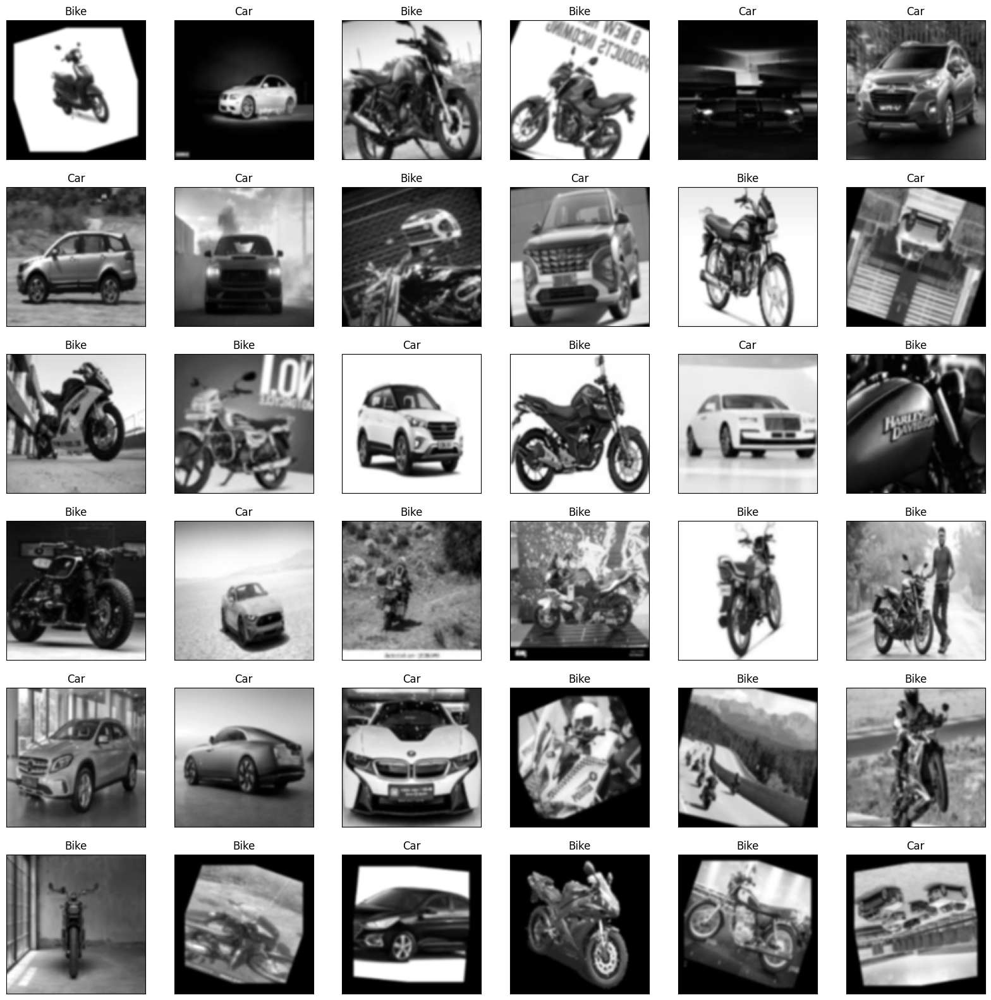

In [21]:
plt.figure(figsize=(20, 20))
for i in range(36):
    plt.subplot(6, 6, i+1)
    plt.imshow(train_imgs[i], cmap="gray")
    plt.title(f"{Categories[train_labels[i]]}")
    plt.xticks([])
    plt.yticks([])
    
plt.show()

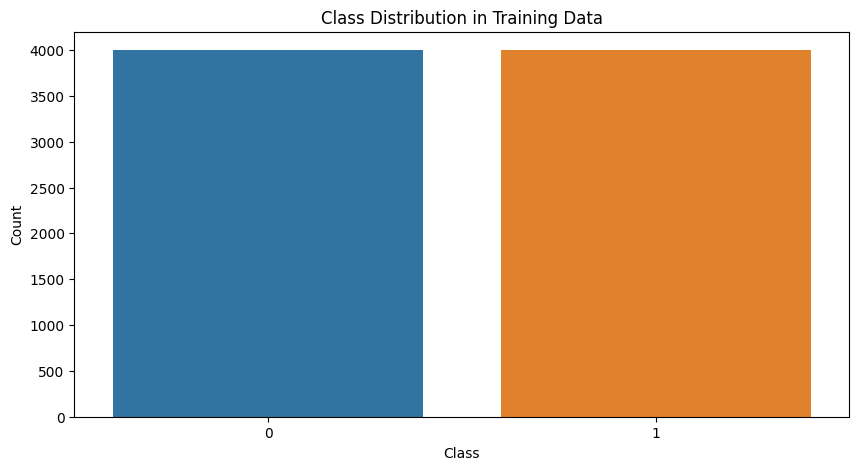

In [22]:
plt.figure(figsize=(10, 5))
sns.countplot(x=train_labels)
plt.title('Class Distribution in Training Data')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

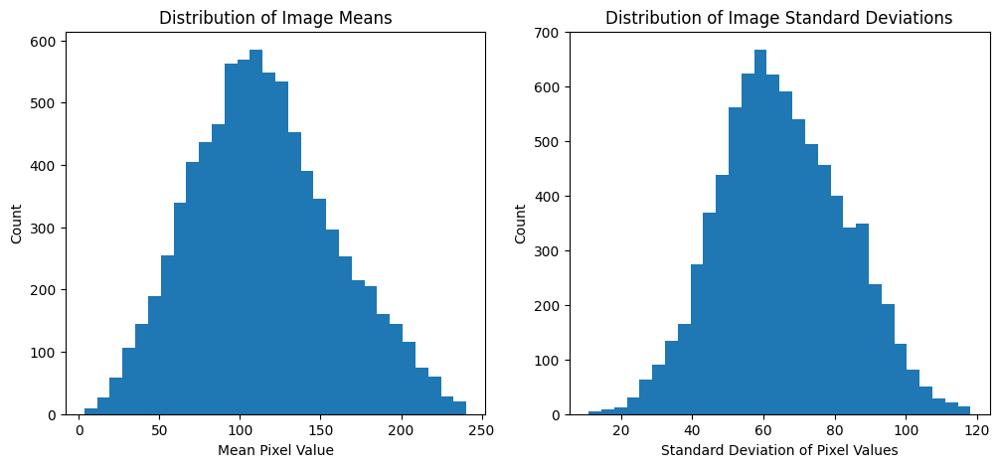

In [23]:
image_means = [np.mean(image) for image in train_imgs]
image_stds = [np.std(image) for image in train_imgs]

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(image_means, bins=30)
plt.title('Distribution of Image Means')
plt.xlabel('Mean Pixel Value')
plt.ylabel('Count')

plt.subplot(1, 2, 2)
plt.hist(image_stds, bins=30)
plt.title('Distribution of Image Standard Deviations')
plt.xlabel('Standard Deviation of Pixel Values')
plt.ylabel('Count')

plt.show()

# Feature Extraction

# Apply GLCM

Processing images:   0%|          | 0/8000 [00:00<?, ?it/s]

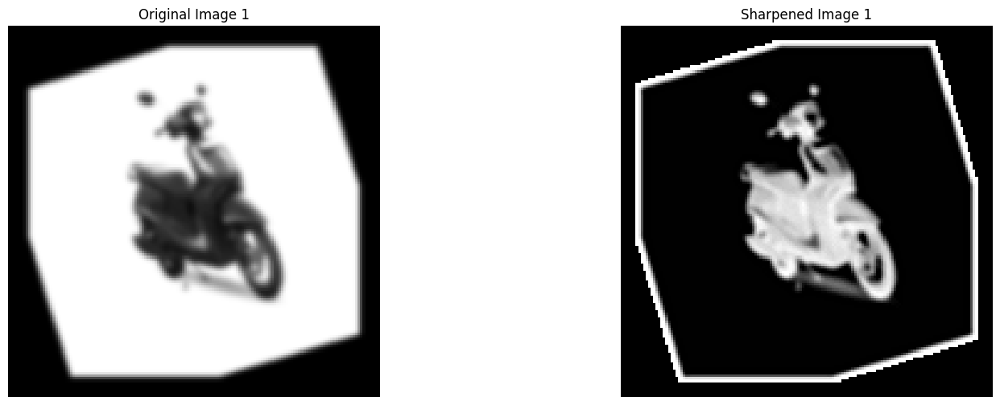

Processing images:   0%|          | 1/8000 [00:00<1:19:56,  1.67it/s]

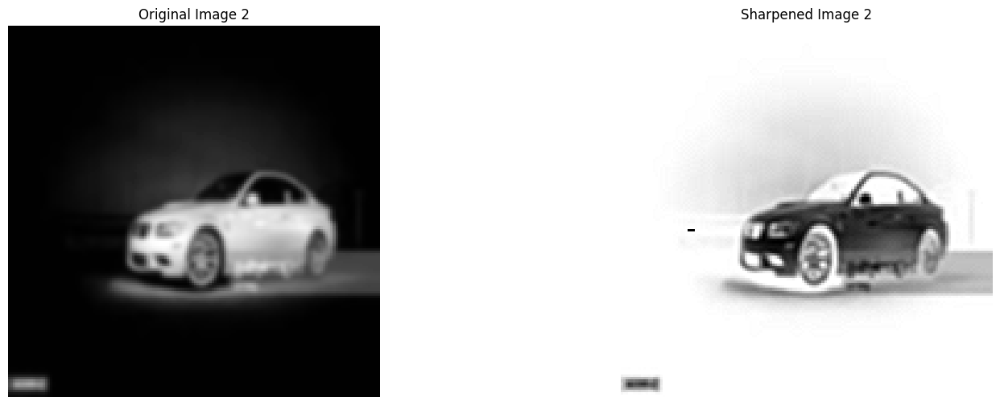

Processing images:   0%|          | 2/8000 [00:00<59:22,  2.24it/s]  

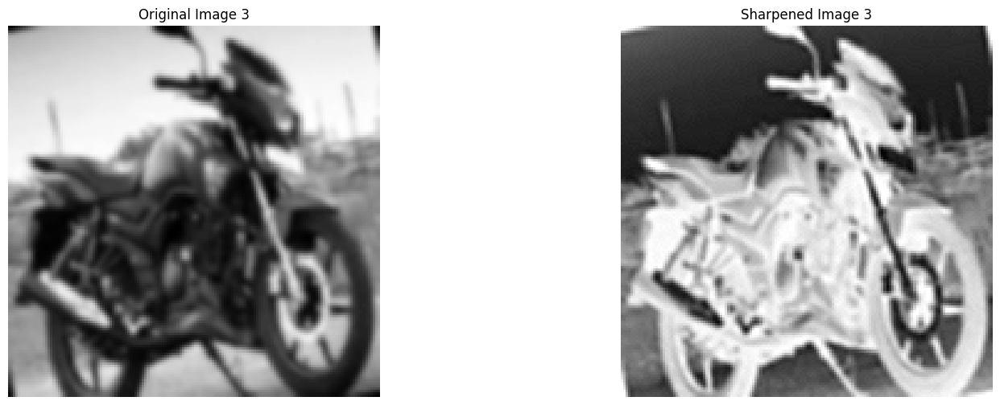

Processing images:   0%|          | 3/8000 [00:01<52:24,  2.54it/s]

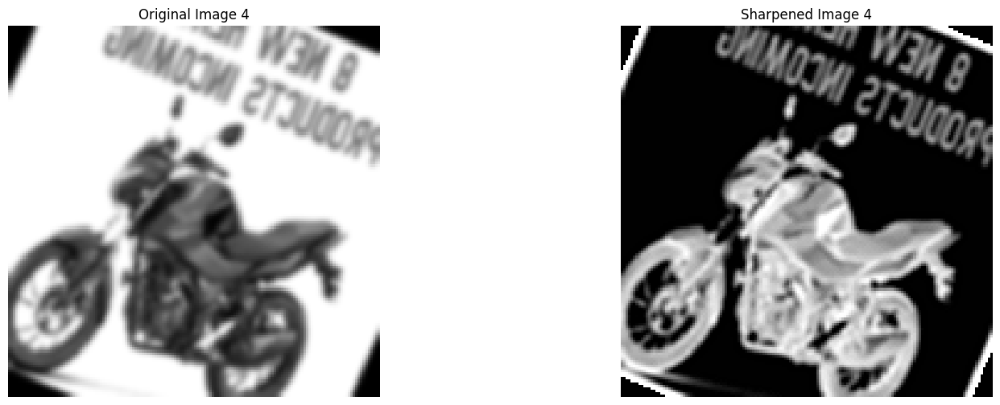

Processing images:   0%|          | 4/8000 [00:01<48:55,  2.72it/s]

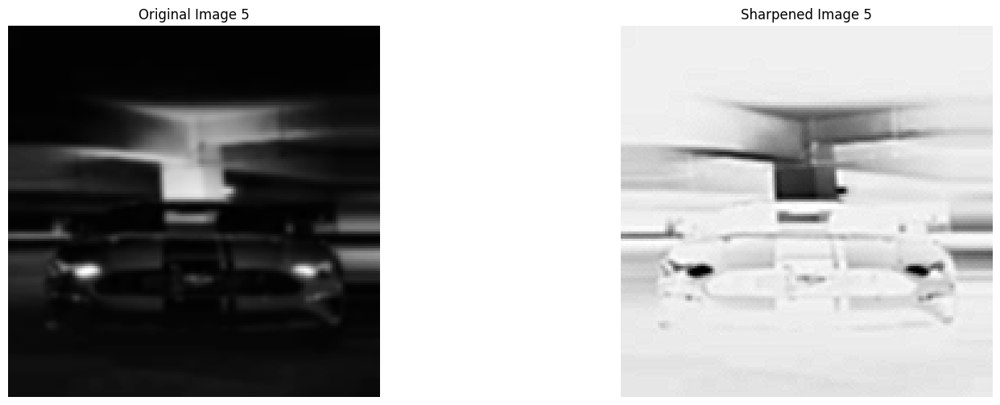

Processing images:   0%|          | 5/8000 [00:01<47:03,  2.83it/s]

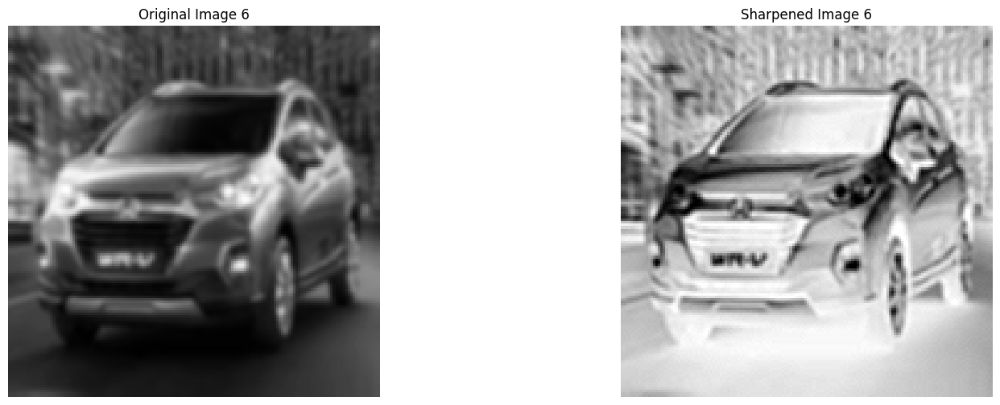

Processing images:   0%|          | 6/8000 [00:02<47:20,  2.81it/s]

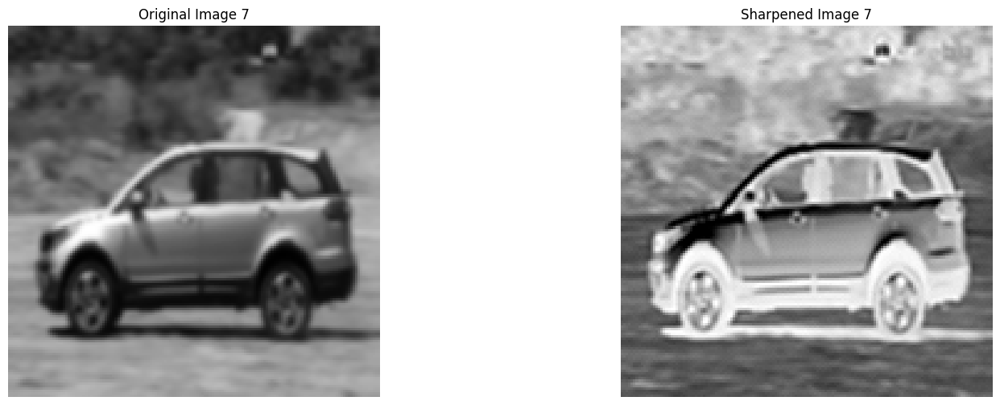

Processing images:   0%|          | 7/8000 [00:02<47:53,  2.78it/s]

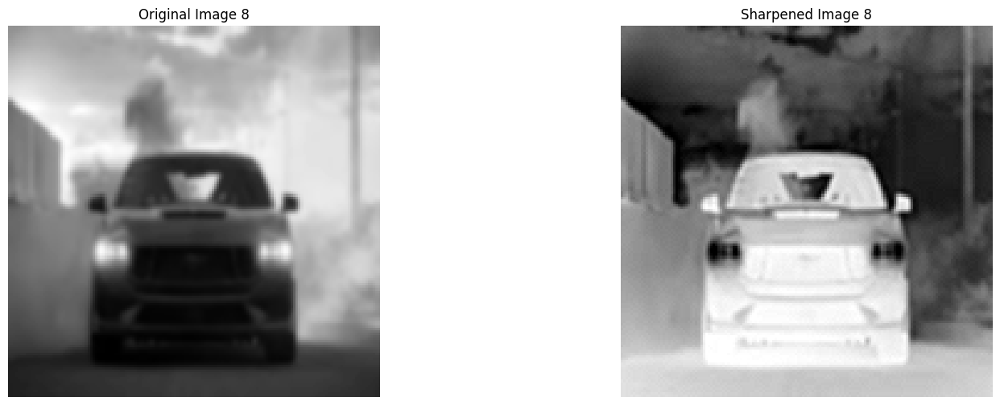

Processing images:   0%|          | 8/8000 [00:02<45:55,  2.90it/s]

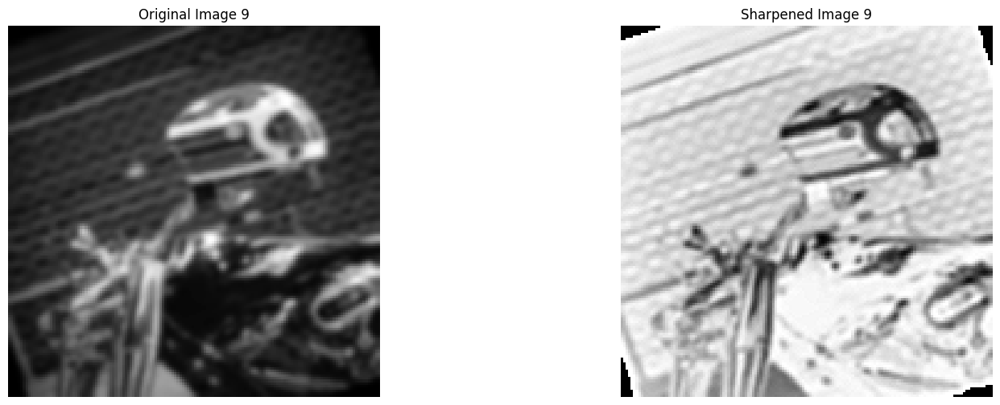

Processing images:   0%|          | 9/8000 [00:03<44:48,  2.97it/s]

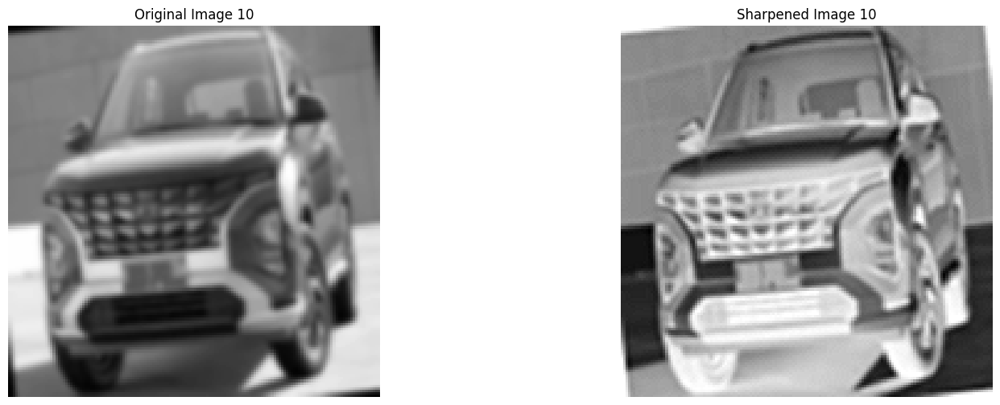

Processing images: 100%|██████████| 8000/8000 [07:35<00:00, 17.58it/s]

Feature Extraction: 8000
[[[[3.98210291e-03 3.01788208e-03 2.72930649e-03 2.43232287e-03]]

  [[1.56599553e-04 2.02693572e-04 2.68456376e-04 2.70258096e-04]]

  [[1.56599553e-04 9.00860322e-05 1.11856823e-04 9.00860322e-05]]

  ...

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]]


 [[[1.56599553e-04 2.02693572e-04 2.68456376e-04 2.70258096e-04]]

  [[1.34228188e-04 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[4.47427293e-05 2.25215080e-05 0.00000000e+00 2.25215080e-05]]

  ...

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]]]


 [[[1.56599553e-04 9.00860322e-05 1.11856823e-04 9.00860322e-05]]

  [[4.47427293e-05 2.25215080e-05 0.00000000e+00 2.25215080e-05]]

  [[0.00000000e+00 

In [24]:
from skimage.feature import graycomatrix, graycoprops

# List to store extracted GLCM features
extracted_features = []
images_feature = []

# Parameters for GLCM
distances = [1]  # Distance between pixel pairs
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # Angles for the co-occurrence matrix

# Sharpening filter kernel
sharpening_kernel = np.array([[0, -1, 0],
                               [-1, 5,-1],
                               [0, -1, 0]])

# Number of sample images to display
num_samples_to_show = 10

for idx, img in enumerate(tqdm(train_imgs, desc="Processing images")):
    if len(img.shape) == 2:  # Grayscale image
        gray_img = img
    else:  # RGB image
        gray_img = color.rgb2gray(img)
    
    # Normalize gray image to 0-255 and convert to uint8
    gray_img = (gray_img * 255).astype(np.uint8)
    
    # Apply sharpening filter
    sharpened_img = cv2.filter2D(gray_img, -1, sharpening_kernel)
    
    # Compute GLCM matrix for the sharpened image
    glcm = graycomatrix(sharpened_img, distances=distances, angles=angles, symmetric=True, normed=True)
    
    # Extract GLCM properties (Contrast, Correlation, Energy, and Homogeneity)
    contrast = graycoprops(glcm, 'contrast').flatten()
    correlation = graycoprops(glcm, 'correlation').flatten()
    energy = graycoprops(glcm, 'energy').flatten()
    homogeneity = graycoprops(glcm, 'homogeneity').flatten()
    
    # Combine all GLCM features into one array
    features = np.hstack([contrast, correlation, energy, homogeneity])
    images_feature.append(features.flatten())
    
    # Visualization
    if idx < num_samples_to_show:
        fig, ax = plt.subplots(1, 2, figsize=(18, 6))
        ax[0].imshow(img, cmap='gray')
        ax[0].set_title(f'Original Image {idx+1}')
        ax[0].axis('off')
        
        ax[1].imshow(sharpened_img, cmap='gray')
        ax[1].set_title(f'Sharpened Image {idx+1}')
        ax[1].axis('off')
        
        plt.show()

# Convert features to a NumPy array
images_feature = np.array(images_feature)
print(f'Feature Extraction: {len(images_feature)}')
print(glcm)

# Split the data

In [25]:
x_train, x_test, y_train, y_test = train_test_split(images_feature, train_labels, train_size=0.75, random_state=64)

print(f'Shape of Training Data: {x_train.shape}')
print(f'Shape of Testing Data: {x_test.shape}')

Shape of Training Data: (6000, 16)
Shape of Testing Data: (2000, 16)


In [26]:
x_train[0]

array([7.82439821e+01, 1.65267826e+02, 1.08314631e+02, 1.73904103e+02,
       9.48803429e-01, 8.92032985e-01, 9.28945097e-01, 8.86388671e-01,
       3.43303443e-02, 2.75881579e-02, 2.75464818e-02, 2.63961874e-02,
       2.76715284e-01, 1.85945439e-01, 1.85367339e-01, 1.72560000e-01])

In [27]:
x_train[0].shape

(16,)

## Model training

## RandomForestClassifier Model (GLCM)

In [28]:
# Random Forest
RandomForest = RandomForestClassifier(n_estimators=170, min_samples_split=3, min_samples_leaf=4, max_depth=15)

RandomForest.fit(x_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_leaf=4, min_samples_split=3,
                       n_estimators=170)

In [29]:
# make cross validation
cross_validation = cross_val_score(estimator=RandomForest, X=x_train, y=y_train, scoring="balanced_accuracy",
                                  cv=5, n_jobs=-1)
print(f"The Scores is ==> {cross_validation}")
print("--"*50)
print(f"The Mean Of The Scores is ==> {cross_validation.mean()}")

print("**"*50)

# make cross validation to predict
cross_validation_pred = cross_val_predict(estimator=RandomForest, X=x_train, y=y_train, method="predict",
                                         cv=5, n_jobs=-1)

The Scores is ==> [0.75423908 0.75563914 0.72323078 0.71559831 0.7316897 ]
----------------------------------------------------------------------------------------------------
The Mean Of The Scores is ==> 0.7360794005672887
****************************************************************************************************


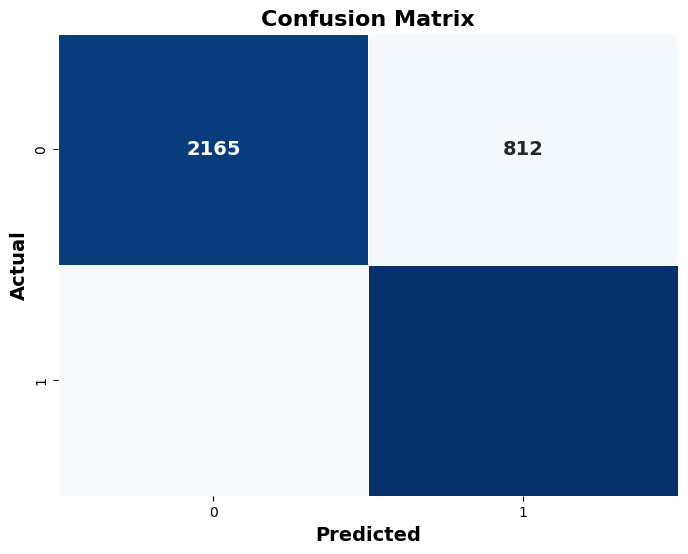

In [30]:
# Compute the confusion matrix
confusion = confusion_matrix(y_train, cross_validation_pred)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)
# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [31]:
# make prediction
y_pred_RandomForest = RandomForest.predict(x_test)
y_pred_RandomForest

array([0, 1, 0, ..., 0, 1, 1])

In [32]:
# prediction
pd.DataFrame(np.c_[y_pred_RandomForest, y_test], columns=["prediction", "Actual"])

,prediction,Actual
0,0,0
1,1,0
2,0,0
3,1,0
4,1,1
...,...,...
1995,1,0
1996,1,1
1997,0,0
1998,1,1


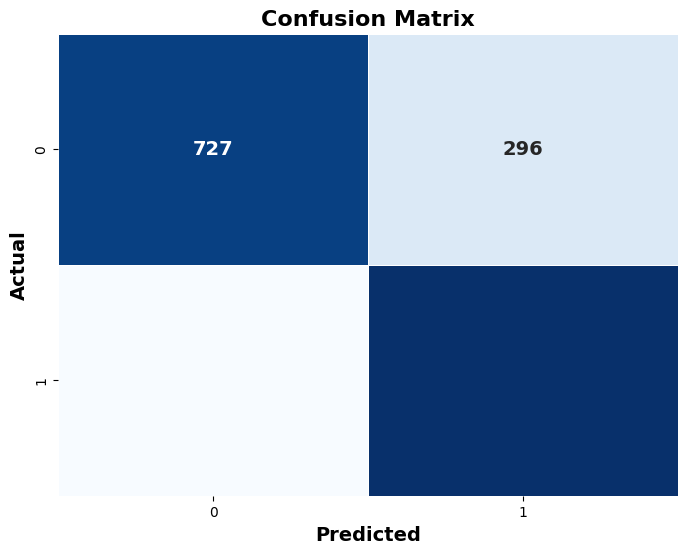

In [33]:
# Compute the confusion matrix on the test
confusion = confusion_matrix(y_test, y_pred_RandomForest)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [34]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(y_test, y_pred_RandomForest)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.77      0.71      0.74      1023
           1       0.72      0.78      0.75       977

    accuracy                           0.74      2000
   macro avg       0.74      0.74      0.74      2000
weighted avg       0.74      0.74      0.74      2000



In [35]:
# the scores
print(f"The Score On The Train => {RandomForest.score(x_train, y_train)*100:0.2f} %")
print(f"The Score On The Test => {RandomForest.score(x_test, y_test)*100:0.2f} %")

The Score On The Train => 93.40 %
The Score On The Test => 74.30 %


In [36]:
import pickle
# Save the model to a file using pickle
with open("RandomForestModel(GLCM).pkl", "wb") as f:
    pickle.dump(RandomForest, f)

# Deep Learning Model(GLCM)

In [37]:
# Create Model
input_shape = (16,)
model = Sequential()

model.add(layers.InputLayer(input_shape=input_shape))

model.add(layers.Dense(1024, activation='relu'))  
model.add(layers.Dropout(0.2))  
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(16, activation='relu'))

model.add(layers.Dense(2, activation='softmax'))

model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 1024)              17408     
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 128)              

In [26]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the model checkpoint callback
checkpoint = ModelCheckpoint(
    "best_model.h5.keras",            # Filepath where the model is saved
    monitor='val_loss',         # Monitor validation loss
    save_best_only=True,        # Save only the model with the best performance
    mode='min',                 # Save when 'val_loss' decreases (minimization)
    verbose=1                   # Verbosity mode, to display when a model is saved
)

# Train the model with the checkpoint callback
history = model.fit(
    x_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(x_test, y_test),
    callbacks=[checkpoint]       
)


Epoch 1/100
185/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.4420 - loss: 5.4516
Epoch 1: val_loss improved from inf to 0.69503, saving model to best_model.h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.4428 - loss: 5.3890 - val_accuracy: 0.5090 - val_loss: 0.6950
Epoch 2/100
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5241 - loss: 0.8374
Epoch 2: val_loss improved from 0.69503 to 0.69192, saving model to best_model.h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5241 - loss: 0.8370 - val_accuracy: 0.5325 - val_loss: 0.6919
Epoch 3/100
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5203 - loss: 0.7588
Epoch 3: val_loss did not improve from 0.69192
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5204 - loss: 0.7588 - val_accuracy: 0.5660 - val_loss: 0.6973
Epoch 4/100
185/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5495 - loss: 0.7338
Epoch 4: val_loss improved from 0.69192 to 0.68681, saving model to best_mod

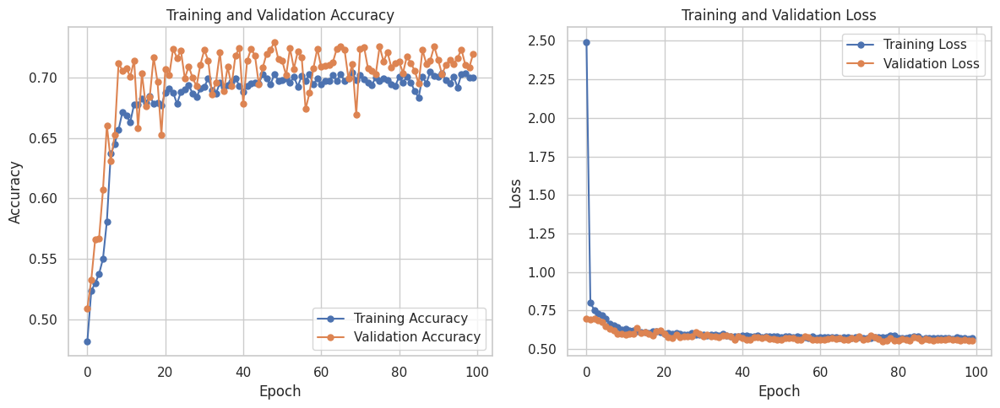

In [27]:
# The style
sns.set(style='whitegrid')

# Plotting training history
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', linestyle='-', marker='o', markersize=5)
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', linestyle='-', marker='o', markersize=5)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', linestyle='-', marker='o', markersize=5)
plt.plot(history.history['val_loss'], label='Validation Loss', linestyle='-', marker='o', markersize=5)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [30]:
# use the best model
from tensorflow.keras.models import load_model

# Load the saved model from the file
best_model = load_model('/kaggle/working/best_model.h5.keras')

predictions = best_model.predict(x_test)



63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [31]:
predictions

array([[5.78012288e-01, 4.21984673e-01, 5.59165926e-07, ...,
        1.27143636e-07, 1.66948359e-06, 6.93082924e-09],
       [8.26230407e-01, 1.73769608e-01, 2.73236273e-12, ...,
        6.21977188e-13, 1.13765386e-10, 4.72733191e-17],
       [8.04754570e-02, 9.19524550e-01, 3.88909233e-29, ...,
        1.16508349e-36, 1.42578240e-27, 0.00000000e+00],
       ...,
       [9.67274159e-02, 9.03272629e-01, 1.84239497e-26, ...,
        3.38038233e-33, 4.37335611e-25, 0.00000000e+00],
       [9.76680040e-01, 2.33199038e-02, 4.97534486e-28, ...,
        7.51050146e-29, 5.42225121e-23, 0.00000000e+00],
       [6.81732476e-01, 3.18262696e-01, 3.47115616e-07, ...,
        2.19818901e-07, 2.81094367e-06, 4.93350250e-09]], dtype=float32)

In [32]:
# Evaluate the model on the test set
loss, accuracy = best_model.evaluate(x_test, y_test)
print(f"Test Accuracy: {accuracy*100:.2f}%")
print(f"Test Loss: {loss*100:.2f}%")

63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7223 - loss: 0.5507
Test Accuracy: 71.35%
Test Loss: 55.27%


In [33]:
the_predictions = []
for i in range(len(predictions)):
    the_predictions.append(np.argmax(predictions[i]))
print(the_predictions[:20])

[0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0]


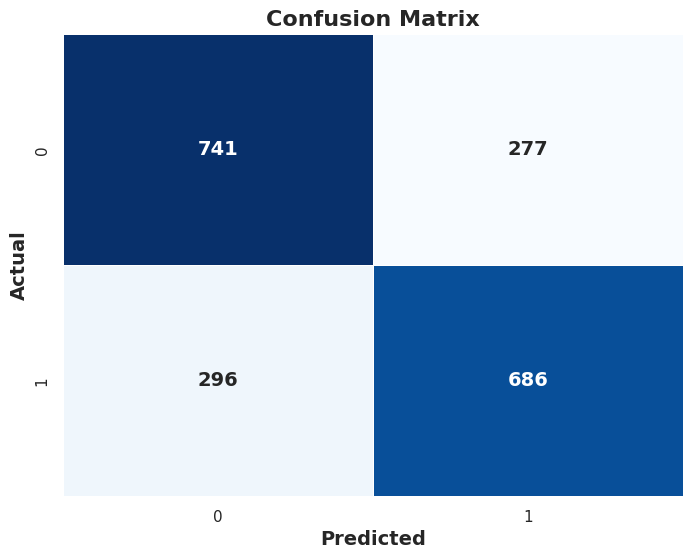

In [34]:
# Compute the confusion matrix
confusion = confusion_matrix(y_test, the_predictions)
# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [35]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(y_test, the_predictions)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.71      0.73      0.72      1018
           1       0.71      0.70      0.71       982

    accuracy                           0.71      2000
   macro avg       0.71      0.71      0.71      2000
weighted avg       0.71      0.71      0.71      2000



# Local binary pattern(LBP)


Processing images:   0%|          | 0/8000 [00:00<?, ?it/s]

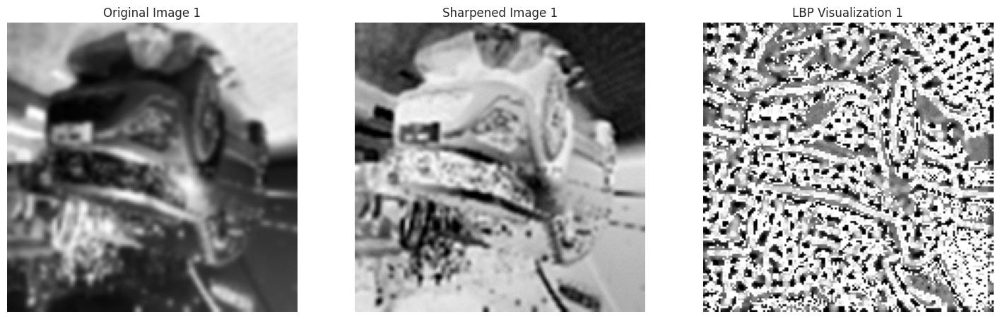

Processing images:   0%|          | 1/8000 [00:00<1:42:41,  1.30it/s]

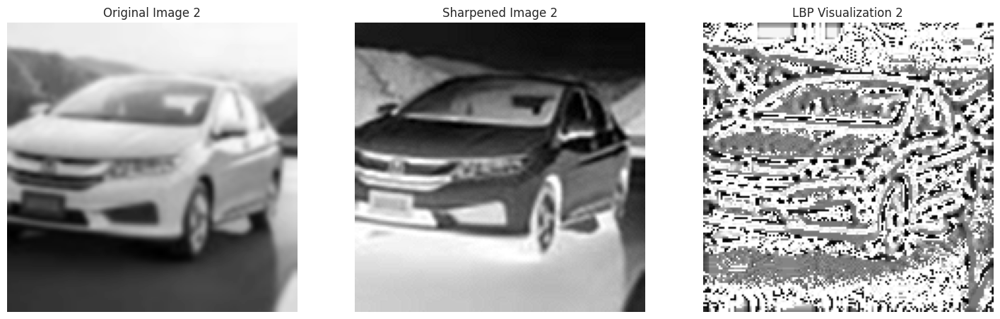

Processing images:   0%|          | 2/8000 [00:01<2:17:08,  1.03s/it]

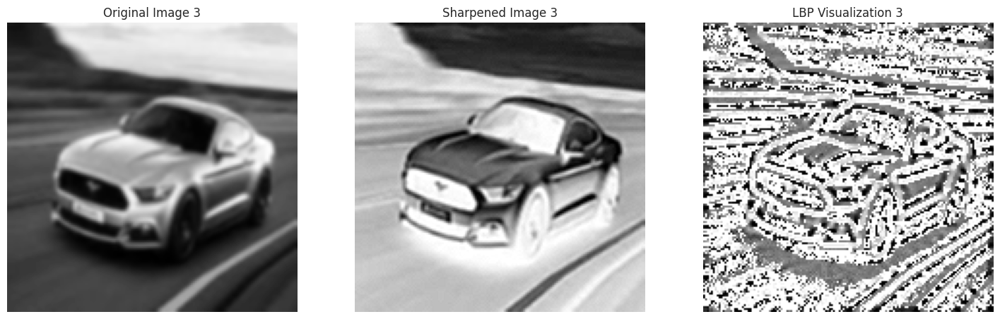

Processing images:   0%|          | 3/8000 [00:02<2:00:20,  1.11it/s]

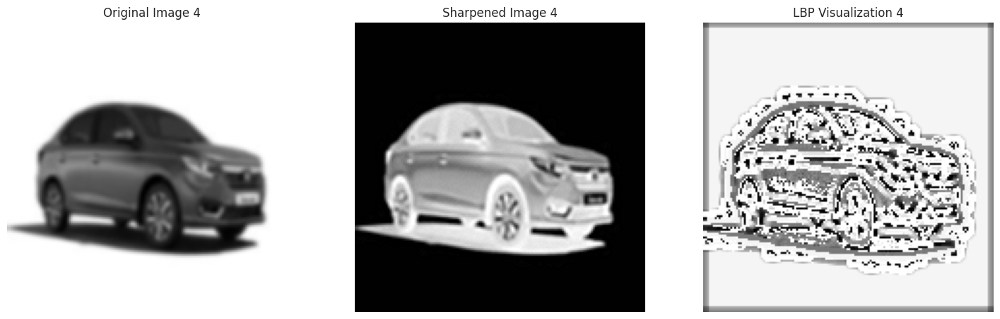

Processing images:   0%|          | 4/8000 [00:03<1:49:19,  1.22it/s]

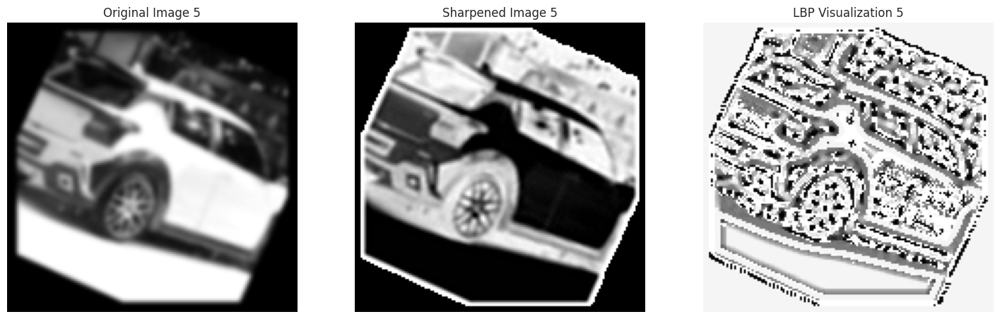

Processing images:   0%|          | 5/8000 [00:04<1:47:20,  1.24it/s]

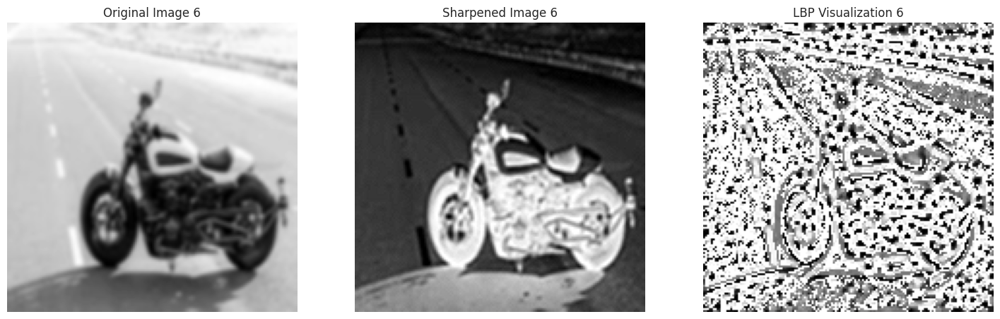

Processing images:   0%|          | 6/8000 [00:04<1:44:56,  1.27it/s]

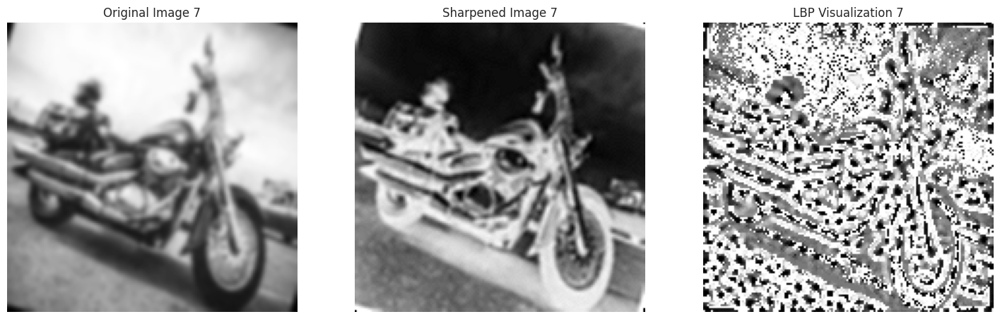

Processing images:   0%|          | 7/8000 [00:05<1:43:50,  1.28it/s]

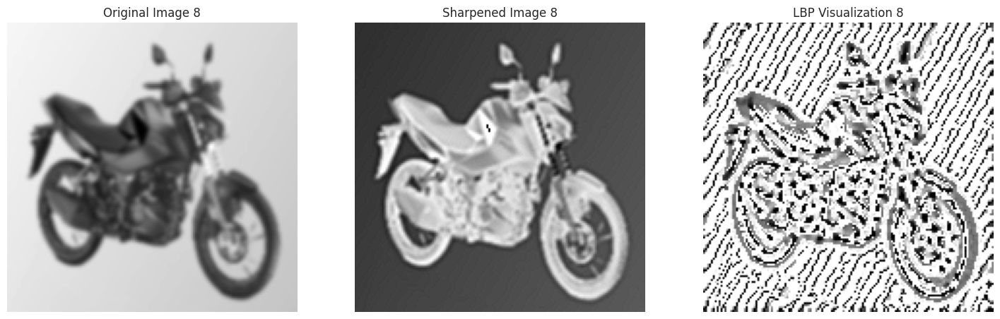

Processing images:   0%|          | 8/8000 [00:06<1:41:43,  1.31it/s]

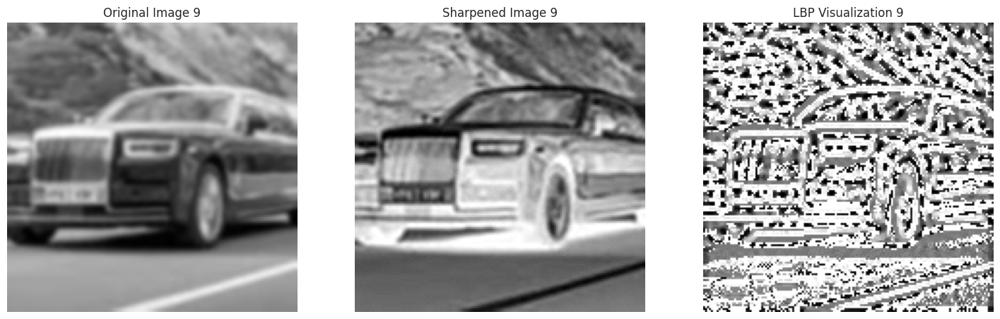

Processing images:   0%|          | 9/8000 [00:07<1:39:49,  1.33it/s]

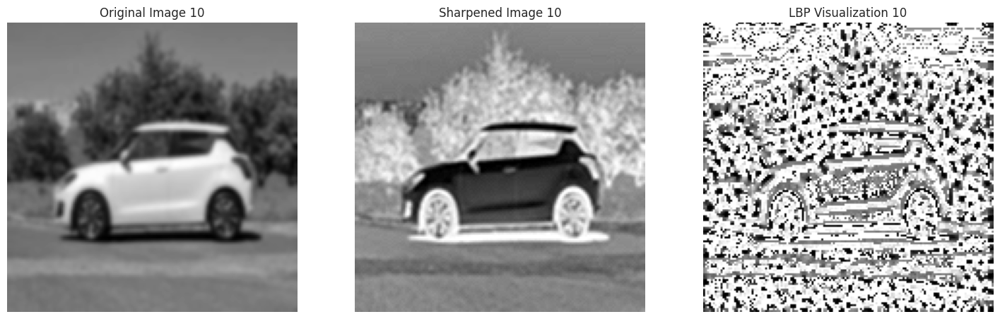

Processing images: 100%|██████████| 8000/8000 [01:33<00:00, 85.13it/s]

Feature Extraction: 8000


In [36]:
from skimage.feature import local_binary_pattern

# List to store extracted LBP features
extracted_features = []
images_feature = []

# Parameters for LBP
radius = 3  # Radius for LBP
n_points = 8 * radius  # Number of points to consider in the LBP pattern

# Sharpening filter kernel
sharpening_kernel = np.array([[0, -1, 0],
                               [-1, 5,-1],
                               [0, -1, 0]])

# Number of sample images to display
num_samples_to_show = 10

for idx, img in enumerate(tqdm(train_imgs, desc="Processing images")):
    if len(img.shape) == 2:  # Grayscale image
        gray_img = img
    else:  # RGB image
        gray_img = color.rgb2gray(img)
    
    # Normalize gray image to 0-255 and convert to uint8
    gray_img = (gray_img * 255).astype(np.uint8)
    
    # Apply sharpening filter
    sharpened_img = cv2.filter2D(gray_img, -1, sharpening_kernel)
    
    # Compute LBP for the sharpened image
    lbp = local_binary_pattern(sharpened_img, n_points, radius, method='uniform')
    
    # Flatten LBP features and append to list
    (hist, _) = np.histogram(lbp.ravel(),
                             bins=np.arange(0, n_points + 3),
                             range=(0, n_points + 2))
    
    # Normalize the histogram
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)
    
    images_feature.append(hist.flatten())
    
    # Visualization 
    if idx < num_samples_to_show:
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        ax[0].imshow(img, cmap='gray')
        ax[0].set_title(f'Original Image {idx+1}')
        ax[0].axis('off')
        
        ax[1].imshow(sharpened_img, cmap='gray')
        ax[1].set_title(f'Sharpened Image {idx+1}')
        ax[1].axis('off')
        
        ax[2].imshow(lbp, cmap='gray')
        ax[2].set_title(f'LBP Visualization {idx+1}')
        ax[2].axis('off')
        
        plt.show()

# Convert features to a NumPy array
images_feature = np.array(images_feature)
print(f'Feature Extraction: {len(images_feature)}')


In [37]:
x_train, x_test, y_train, y_test = train_test_split(images_feature, train_labels, train_size=0.75, random_state=64)

print(f'Shape of Training Data: {x_train.shape}')
print(f'Shape of Testing Data: {x_test.shape}')

Shape of Training Data: (6000, 26)
Shape of Testing Data: (2000, 26)


In [38]:
x_train[0]

array([0.052     , 0.03613333, 0.02662222, 0.01871111, 0.01444444,
       0.01111111, 0.01031111, 0.01275556, 0.01204444, 0.01226667,
       0.01746667, 0.03342222, 0.06368889, 0.0392    , 0.01586667,
       0.01404444, 0.01071111, 0.01164444, 0.01022222, 0.01142222,
       0.01306667, 0.01817778, 0.02493333, 0.0272    , 0.05475556,
       0.42777778])

In [39]:
x_train[0].shape

(26,)

# Model training

## RandomForestClassifier Model (LBP)

In [40]:
# Random Forest
RandomForest = RandomForestClassifier(n_estimators=170, min_samples_split=3, min_samples_leaf=4, max_depth=15)

RandomForest.fit(x_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_leaf=4, min_samples_split=3,
                       n_estimators=170)

In [41]:
# make cross validation
cross_validation = cross_val_score(estimator=RandomForest, X=x_train, y=y_train, scoring="balanced_accuracy",
                                  cv=5, n_jobs=-1)
print(f"The Scores is ==> {cross_validation}")
print("--"*50)
print(f"The Mean Of The Scores is ==> {cross_validation.mean()}")

print("**"*50)

# make cross validation to predict
cross_validation_pred = cross_val_predict(estimator=RandomForest, X=x_train, y=y_train, method="predict",
                                         cv=5, n_jobs=-1)

The Scores is ==> [0.79659491 0.8025159  0.78235144 0.79240744 0.78589604]
----------------------------------------------------------------------------------------------------
The Mean Of The Scores is ==> 0.7919531458199932
****************************************************************************************************


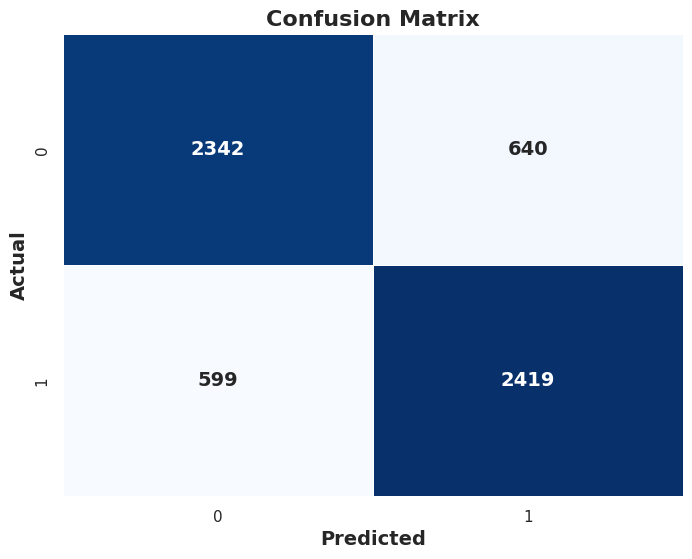

In [42]:
# Compute the confusion matrix
confusion = confusion_matrix(y_train, cross_validation_pred)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)
# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [43]:
# make prediction
y_pred_RandomForest = RandomForest.predict(x_test)
y_pred_RandomForest

array([0, 1, 1, ..., 1, 0, 0])

In [44]:
# prediction
pd.DataFrame(np.c_[y_pred_RandomForest, y_test], columns=["prediction", "Actual"])

,prediction,Actual
0,0,1
1,1,0
2,1,1
3,1,1
4,1,0
...,...,...
1995,1,0
1996,1,1
1997,1,1
1998,0,0


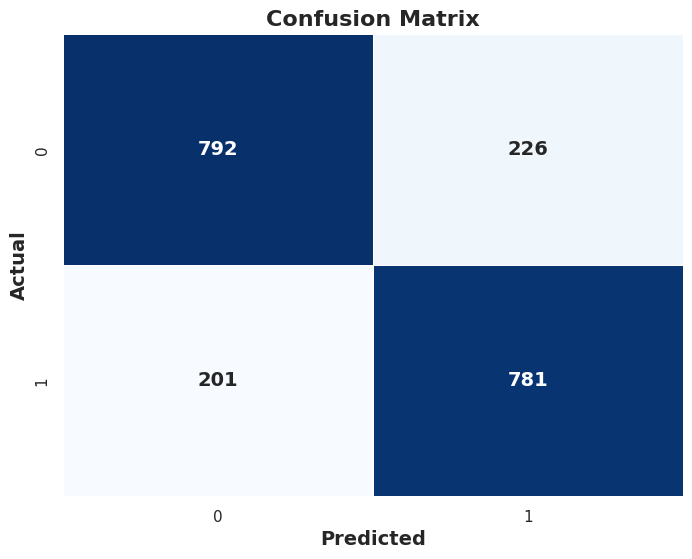

In [45]:
# Compute the confusion matrix on the test
confusion = confusion_matrix(y_test, y_pred_RandomForest)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [46]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(y_test, y_pred_RandomForest)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.80      0.78      0.79      1018
           1       0.78      0.80      0.79       982

    accuracy                           0.79      2000
   macro avg       0.79      0.79      0.79      2000
weighted avg       0.79      0.79      0.79      2000



In [47]:
# the scores
print(f"The Score On The Train => {RandomForest.score(x_train, y_train)*100:0.2f} %")
print(f"The Score On The Test => {RandomForest.score(x_test, y_test)*100:0.2f} %")

The Score On The Train => 95.72 %
The Score On The Test => 78.65 %


In [48]:
import pickle
# Save the model to a file using pickle
with open("RandomForestModel(LBP).pkl", "wb") as f:
    pickle.dump(RandomForest, f)

# Deep Learning Model(LBP)

In [51]:
# Create Model
input_shape = (26,)
model = Sequential()

model.add(layers.InputLayer(input_shape=input_shape))

model.add(layers.Dense(1024, activation='relu'))  
model.add(layers.Dropout(0.2))  
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(16, activation='relu'))

model.add(layers.Dense(2, activation='softmax'))

model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_16 (Dense)                │ (None, 1024)           │        27,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 7)              │           119 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 727,655 (2.78 MB)

 Trainable params: 727,655 (2.78 MB)

 Non-trainable params: 0 (0.00 B)

In [52]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the model checkpoint callback
checkpoint = ModelCheckpoint(
    "best_model(LBP).h5.keras",            # Filepath where the model is saved
    monitor='val_loss',         # Monitor validation loss
    save_best_only=True,        # Save only the model with the best performance
    mode='min',                 # Save when 'val_loss' decreases (minimization)
    verbose=1                   # Verbosity mode, to display when a model is saved
)

# Train the model with the checkpoint callback
history = model.fit(
    x_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(x_test, y_test),
    callbacks=[checkpoint]       
)


Epoch 1/100
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.4693 - loss: 1.1955
Epoch 1: val_loss improved from inf to 0.70261, saving model to best_model(LBP).h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.4695 - loss: 1.1940 - val_accuracy: 0.5195 - val_loss: 0.7026
Epoch 2/100
183/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5222 - loss: 0.7138
Epoch 2: val_loss improved from 0.70261 to 0.55686, saving model to best_model(LBP).h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5230 - loss: 0.7134 - val_accuracy: 0.7335 - val_loss: 0.5569
Epoch 3/100
187/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6642 - loss: 0.6204
Epoch 3: val_loss improved from 0.55686 to 0.51129, saving model to best_model(LBP).h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6646 - loss: 0.6201 - val_accuracy: 0.7520 - val_loss: 0.5113
Epoch 4/100
186/188 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7373 - loss: 0.5478
Epoch 4: val_loss di

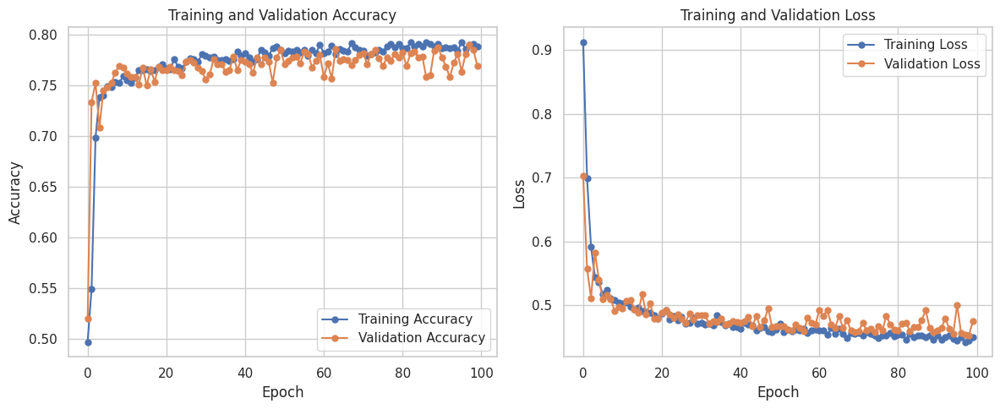

In [53]:
# The style
sns.set(style='whitegrid')

# Plotting training history
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', linestyle='-', marker='o', markersize=5)
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', linestyle='-', marker='o', markersize=5)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', linestyle='-', marker='o', markersize=5)
plt.plot(history.history['val_loss'], label='Validation Loss', linestyle='-', marker='o', markersize=5)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [54]:
# use the best model
from tensorflow.keras.models import load_model

# Load the saved model from the file
best_model = load_model('/kaggle/working/best_model(LBP).h5.keras')

predictions = best_model.predict(x_test)



63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [55]:
# Evaluate the model on the test set
loss, accuracy = best_model.evaluate(x_test, y_test)
print(f"Test Accuracy: {accuracy*100:.2f}%")
print(f"Test Loss: {loss*100:.2f}%")

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7773 - loss: 0.4645
Test Accuracy: 78.45%
Test Loss: 45.29%


In [56]:
the_predictions = []
for i in range(len(predictions)):
    the_predictions.append(np.argmax(predictions[i]))
print(the_predictions[:20])

[0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0]


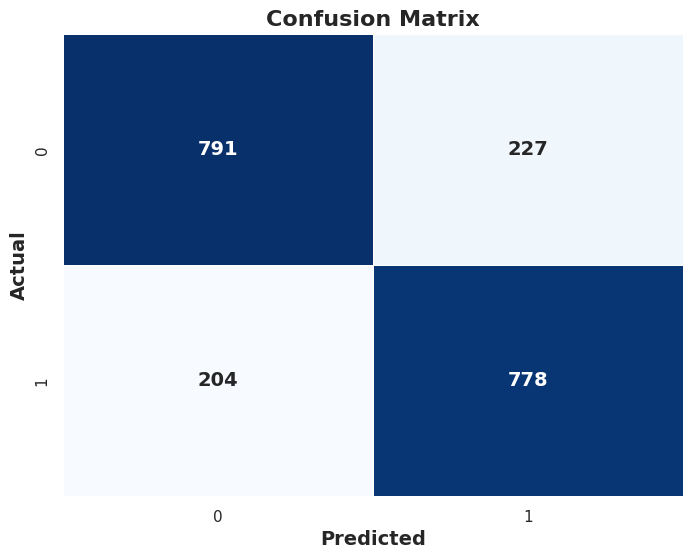

In [57]:
# Compute the confusion matrix
confusion = confusion_matrix(y_test, the_predictions)
# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [58]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(y_test, the_predictions)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.79      0.78      0.79      1018
           1       0.77      0.79      0.78       982

    accuracy                           0.78      2000
   macro avg       0.78      0.78      0.78      2000
weighted avg       0.78      0.78      0.78      2000



# Regional Descriptors

Processing images:   0%|          | 0/8000 [00:00<?, ?it/s]

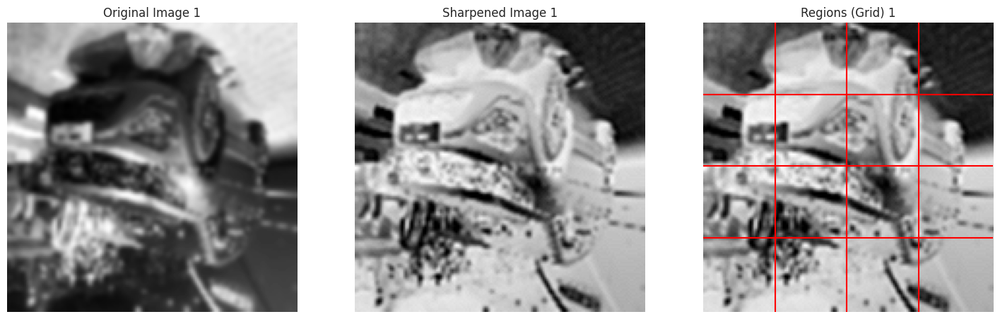

Processing images:   0%|          | 1/8000 [00:00<1:26:18,  1.54it/s]

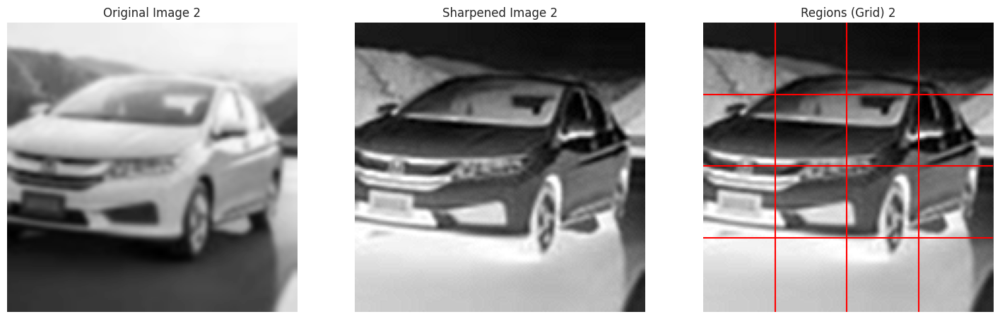

Processing images:   0%|          | 2/8000 [00:01<1:29:50,  1.48it/s]

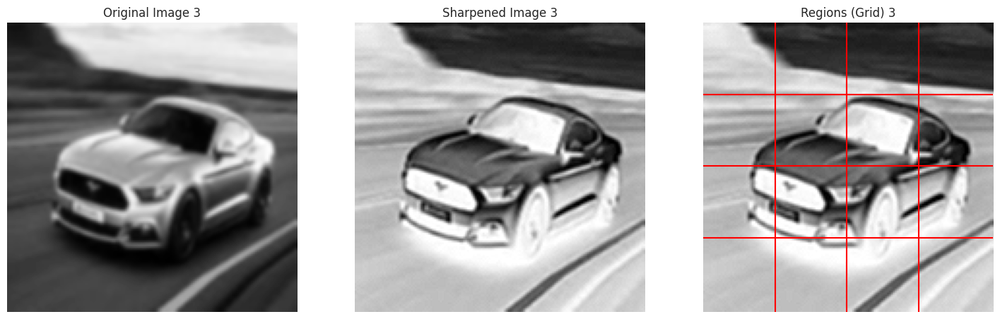

Processing images:   0%|          | 3/8000 [00:02<1:31:43,  1.45it/s]

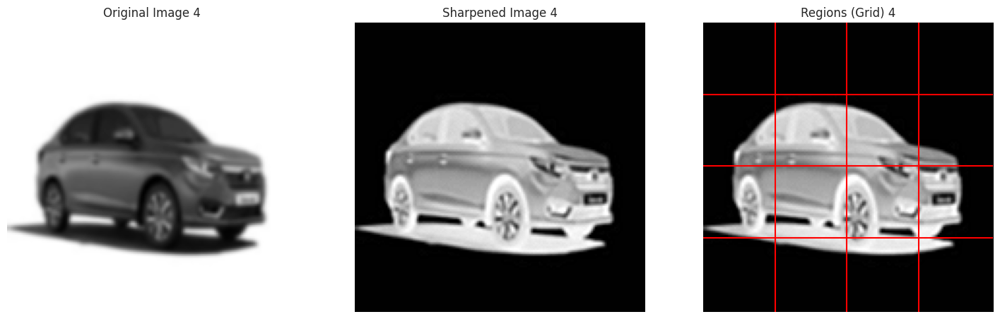

Processing images:   0%|          | 4/8000 [00:02<1:30:31,  1.47it/s]

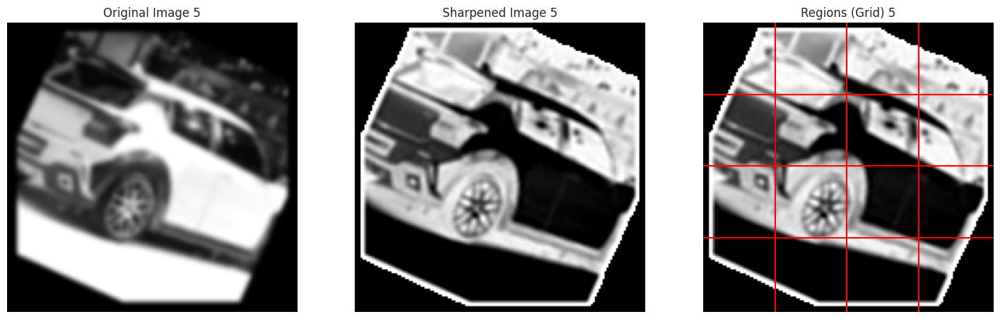

Processing images:   0%|          | 5/8000 [00:03<1:27:52,  1.52it/s]

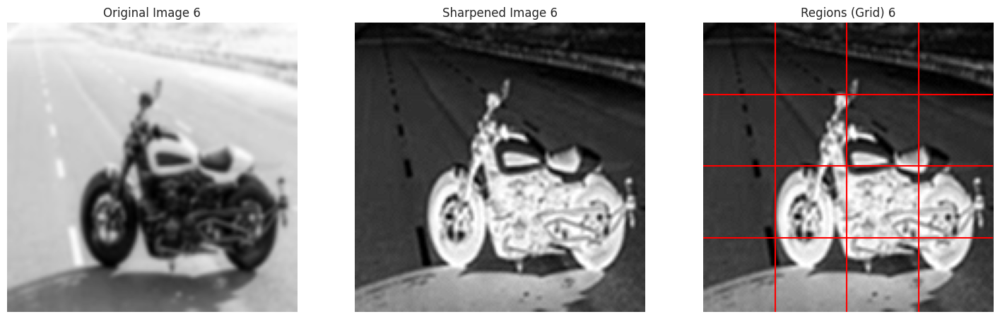

Processing images:   0%|          | 6/8000 [00:04<1:31:03,  1.46it/s]

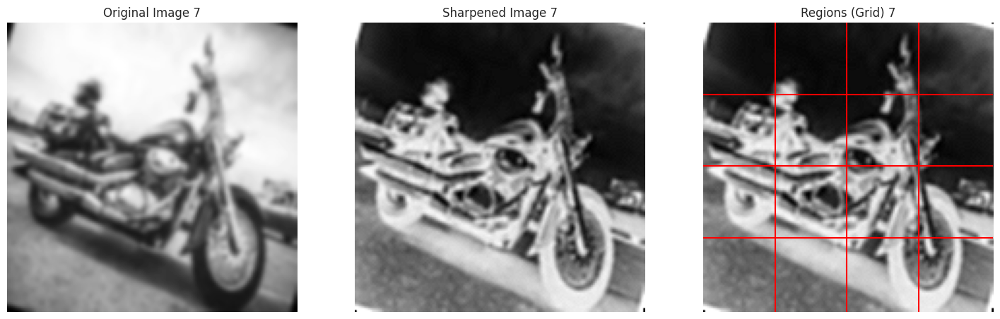

Processing images:   0%|          | 7/8000 [00:04<1:32:54,  1.43it/s]

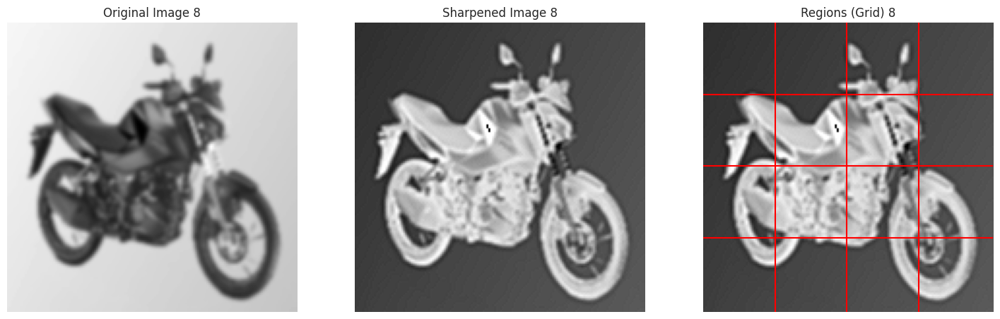

Processing images:   0%|          | 8/8000 [00:05<1:33:02,  1.43it/s]

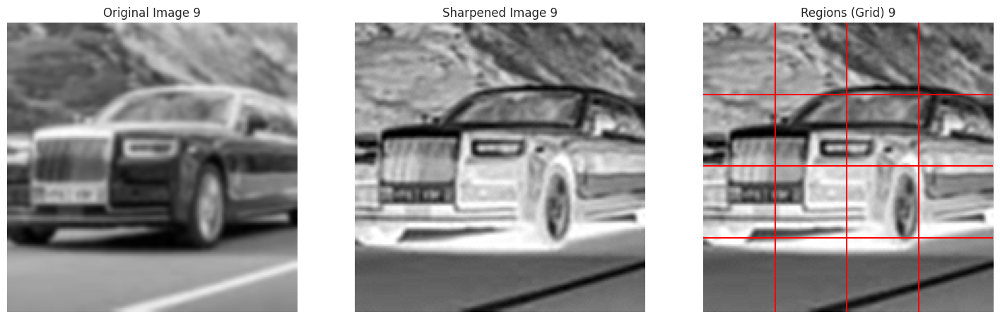

Processing images:   0%|          | 9/8000 [00:06<1:34:37,  1.41it/s]

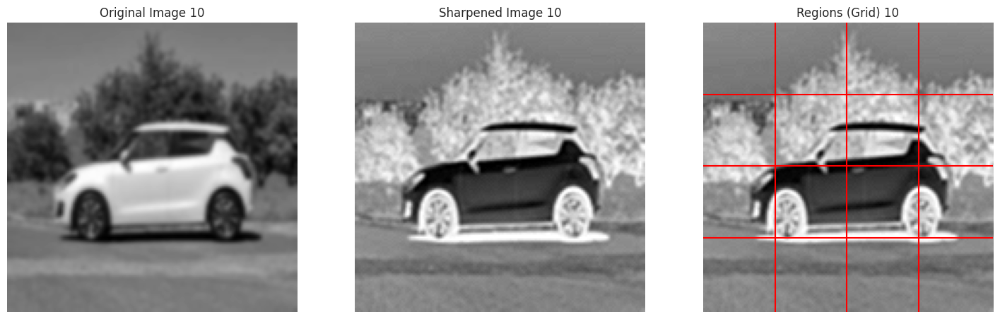

Processing images: 100%|██████████| 8000/8000 [00:13<00:00, 578.44it/s] 

Feature Extraction: 8000


In [60]:
# List to store extracted regional features
extracted_features = []
images_feature = []

# Parameters for regional descriptors
grid_size = (4, 4)  # Divide the image into a 4x4 grid

# Sharpening filter kernel
sharpening_kernel = np.array([[0, -1, 0],
                               [-1, 5,-1],
                               [0, -1, 0]])

# Number of sample images to display
num_samples_to_show = 10

for idx, img in enumerate(tqdm(train_imgs, desc="Processing images")):
    if len(img.shape) == 2:  # Grayscale image
        gray_img = img
    else:  # RGB image
        gray_img = color.rgb2gray(img)
    
    # Normalize gray image to 0-255 and convert to uint8
    gray_img = (gray_img * 255).astype(np.uint8)
    
    # Apply sharpening filter
    sharpened_img = cv2.filter2D(gray_img, -1, sharpening_kernel)
    
    # Get the height and width of the image
    h, w = sharpened_img.shape
    
    # Divide the image into a grid of regions and compute descriptors for each region
    region_features = []
    
    for i in range(grid_size[0]):  # Loop through grid rows
        for j in range(grid_size[1]):  # Loop through grid columns
            # Define the region boundaries
            start_x = i * (h // grid_size[0])
            start_y = j * (w // grid_size[1])
            end_x = (i + 1) * (h // grid_size[0])
            end_y = (j + 1) * (w // grid_size[1])
            
            # Extract the region
            region = sharpened_img[start_x:end_x, start_y:end_y]
            
            # Compute regional descriptors: mean and variance
            mean_val = np.mean(region)
            variance_val = np.var(region)
            
            # Append the descriptors to the region_features list
            region_features.extend([mean_val, variance_val])
    
    # Flatten and store the regional features for the image
    images_feature.append(np.array(region_features).flatten())
    
    # Visualization (only for first num_samples_to_show images)
    if idx < num_samples_to_show:
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        ax[0].imshow(img, cmap='gray')
        ax[0].set_title(f'Original Image {idx+1}')
        ax[0].axis('off')
        
        ax[1].imshow(sharpened_img, cmap='gray')
        ax[1].set_title(f'Sharpened Image {idx+1}')
        ax[1].axis('off')
        
        # Show the grid with regions (for visualization)
        ax[2].imshow(sharpened_img, cmap='gray')
        ax[2].set_title(f'Regions (Grid) {idx+1}')
        for i in range(1, grid_size[0]):
            ax[2].axhline(i * (h // grid_size[0]), color='red')  # Horizontal lines
        for j in range(1, grid_size[1]):
            ax[2].axvline(j * (w // grid_size[1]), color='red')  # Vertical lines
        ax[2].axis('off')
        
        plt.show()

# Convert features to a NumPy array
images_feature = np.array(images_feature)
print(f'Feature Extraction: {len(images_feature)}')


In [61]:
x_train, x_test, y_train, y_test = train_test_split(images_feature, train_labels, train_size=0.75, random_state=64)

print(f'Shape of Training Data: {x_train.shape}')
print(f'Shape of Testing Data: {x_test.shape}')

Shape of Training Data: (6000, 32)
Shape of Testing Data: (2000, 32)


In [62]:
x_train[0]

array([ 113.37545654, 2172.8349272 ,  134.40686633, 1069.05213693,
        104.99780862,  364.47260294,   79.85756026,  334.25363349,
        145.64426589, 1528.78287618,  139.84806428, 2516.07771904,
        194.15631848, 3402.0018611 ,  111.4017531 , 3012.47701665,
        193.66983199, 3121.43226009,  223.81665449, 1197.47478472,
        212.07304602, 2697.47019386,  167.05259313, 4029.67875332,
        205.47552958,  931.76145379,  212.72826881,  947.1547962 ,
        194.06281958,  846.05595144,  189.04747991,  362.11827159])

# Model training

## RandomForestClassifier Model (Regional)

In [64]:
# Random Forest
RandomForest = RandomForestClassifier(n_estimators=170, min_samples_split=3, min_samples_leaf=4, max_depth=15)

RandomForest.fit(x_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_leaf=4, min_samples_split=3,
                       n_estimators=170)

In [65]:
# make cross validation
cross_validation = cross_val_score(estimator=RandomForest, X=x_train, y=y_train, scoring="balanced_accuracy",
                                  cv=5, n_jobs=-1)
print(f"The Scores is ==> {cross_validation}")
print("--"*50)
print(f"The Mean Of The Scores is ==> {cross_validation.mean()}")

print("**"*50)

# make cross validation to predict
cross_validation_pred = cross_val_predict(estimator=RandomForest, X=x_train, y=y_train, method="predict",
                                         cv=5, n_jobs=-1)

The Scores is ==> [0.76164404 0.75093127 0.73584937 0.73247144 0.72811014]
----------------------------------------------------------------------------------------------------
The Mean Of The Scores is ==> 0.7418012533739274
****************************************************************************************************


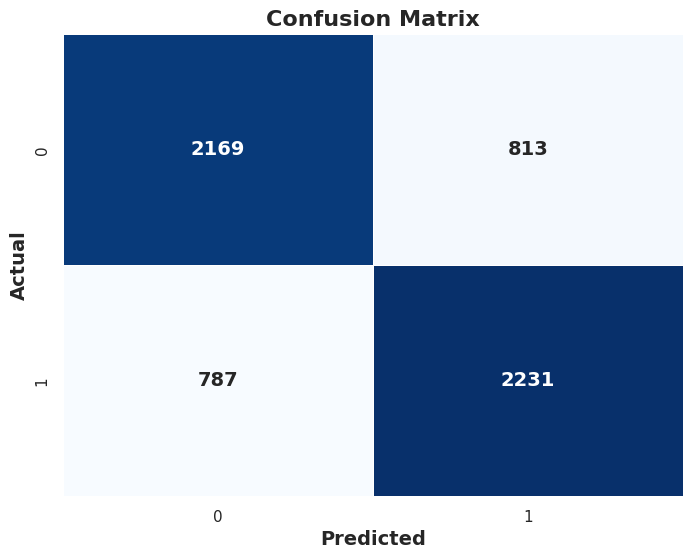

In [66]:
# Compute the confusion matrix
confusion = confusion_matrix(y_train, cross_validation_pred)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)
# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [67]:
# make prediction
y_pred_RandomForest = RandomForest.predict(x_test)
y_pred_RandomForest

array([0, 0, 1, ..., 1, 0, 1])

In [68]:
# prediction
pd.DataFrame(np.c_[y_pred_RandomForest, y_test], columns=["prediction", "Actual"])

,prediction,Actual
0,0,1
1,0,0
2,1,1
3,1,1
4,1,0
...,...,...
1995,1,0
1996,1,1
1997,1,1
1998,0,0


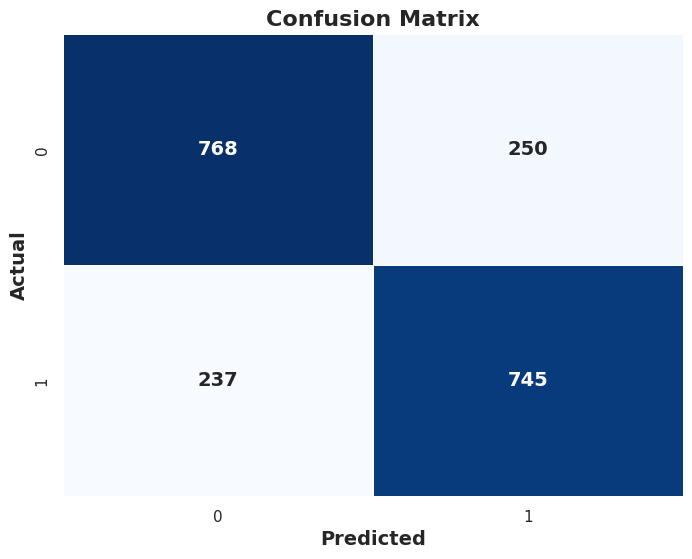

In [69]:
# Compute the confusion matrix on the test
confusion = confusion_matrix(y_test, y_pred_RandomForest)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [70]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(y_test, y_pred_RandomForest)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.76      0.75      0.76      1018
           1       0.75      0.76      0.75       982

    accuracy                           0.76      2000
   macro avg       0.76      0.76      0.76      2000
weighted avg       0.76      0.76      0.76      2000



In [71]:
# the scores
print(f"The Score On The Train => {RandomForest.score(x_train, y_train)*100:0.2f} %")
print(f"The Score On The Test => {RandomForest.score(x_test, y_test)*100:0.2f} %")

The Score On The Train => 98.18 %
The Score On The Test => 75.65 %


In [72]:
import pickle
# Save the model to a file using pickle
with open("RandomForestModel(Regional).pkl", "wb") as f:
    pickle.dump(RandomForest, f)

# Deep Learning Model(Regional)

In [73]:
# Create Model
input_shape = (32,)
model = Sequential()

model.add(layers.InputLayer(input_shape=input_shape))

model.add(layers.Dense(1024, activation='relu'))  
model.add(layers.Dropout(0.2))  
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(16, activation='relu'))

model.add(layers.Dense(2, activation='softmax'))

model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 1024)           │        33,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 7)              │           119 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 733,799 (2.80 MB)

 Trainable params: 733,799 (2.80 MB)

 Non-trainable params: 0 (0.00 B)

In [74]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the model checkpoint callback
checkpoint = ModelCheckpoint(
    "best_model(Regional).h5.keras",            # Filepath where the model is saved
    monitor='val_loss',         # Monitor validation loss
    save_best_only=True,        # Save only the model with the best performance
    mode='min',                 # Save when 'val_loss' decreases (minimization)
    verbose=1                   # Verbosity mode, to display when a model is saved
)

# Train the model with the checkpoint callback
history = model.fit(
    x_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(x_test, y_test),
    callbacks=[checkpoint]       
)


Epoch 1/100
185/188 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3745 - loss: 75.9208
Epoch 1: val_loss improved from inf to 1.29919, saving model to best_model(Regional).h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.3757 - loss: 74.8727 - val_accuracy: 0.4735 - val_loss: 1.2992
Epoch 2/100
184/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.4628 - loss: 2.6366
Epoch 2: val_loss improved from 1.29919 to 0.78289, saving model to best_model(Regional).h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4632 - loss: 2.6198 - val_accuracy: 0.5095 - val_loss: 0.7829
Epoch 3/100
185/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.4925 - loss: 1.2410
Epoch 3: val_loss improved from 0.78289 to 0.70695, saving model to best_model(Regional).h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.4926 - loss: 1.2393 - val_accuracy: 0.5215 - val_loss: 0.7070
Epoch 4/100
184/188 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5147 - loss: 0.9050
Ep

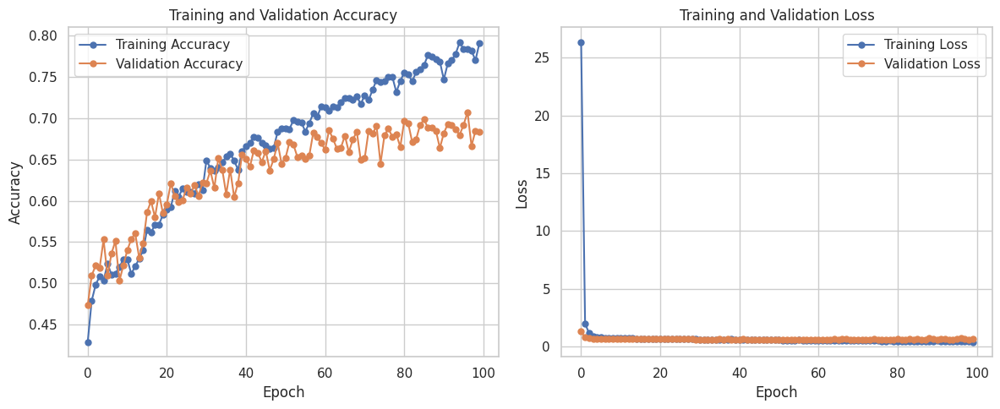

In [75]:
# The style
sns.set(style='whitegrid')

# Plotting training history
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', linestyle='-', marker='o', markersize=5)
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', linestyle='-', marker='o', markersize=5)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', linestyle='-', marker='o', markersize=5)
plt.plot(history.history['val_loss'], label='Validation Loss', linestyle='-', marker='o', markersize=5)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [77]:
# use the best model
from tensorflow.keras.models import load_model

# Load the saved model from the file
best_model = load_model('/kaggle/working/best_model(Regional).h5.keras')

predictions = best_model.predict(x_test)



63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


In [78]:
# Evaluate the model on the test set
loss, accuracy = best_model.evaluate(x_test, y_test)
print(f"Test Accuracy: {accuracy*100:.2f}%")
print(f"Test Loss: {loss*100:.2f}%")

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6635 - loss: 0.6031
Test Accuracy: 66.80%
Test Loss: 59.23%


In [79]:
the_predictions = []
for i in range(len(predictions)):
    the_predictions.append(np.argmax(predictions[i]))
print(the_predictions[:20])

[1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0]


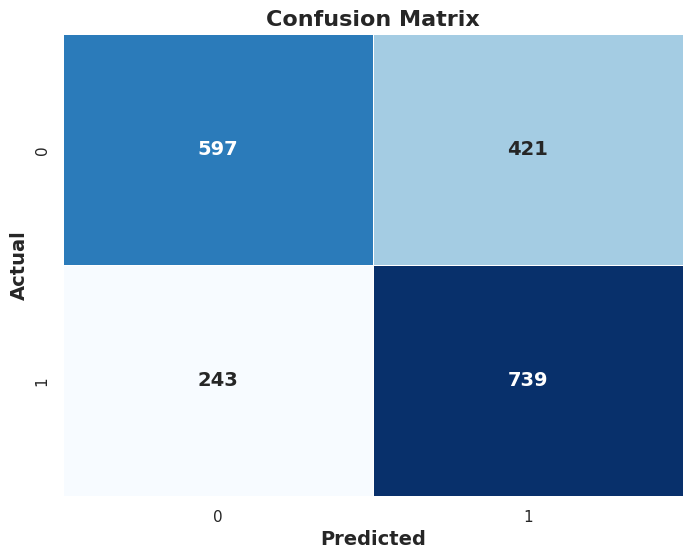

In [80]:
# Compute the confusion matrix
confusion = confusion_matrix(y_test, the_predictions)
# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [81]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(y_test, the_predictions)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.71      0.59      0.64      1018
           1       0.64      0.75      0.69       982

    accuracy                           0.67      2000
   macro avg       0.67      0.67      0.67      2000
weighted avg       0.67      0.67      0.67      2000



# Chain Code

Processing images:   0%|          | 0/8000 [00:00<?, ?it/s]

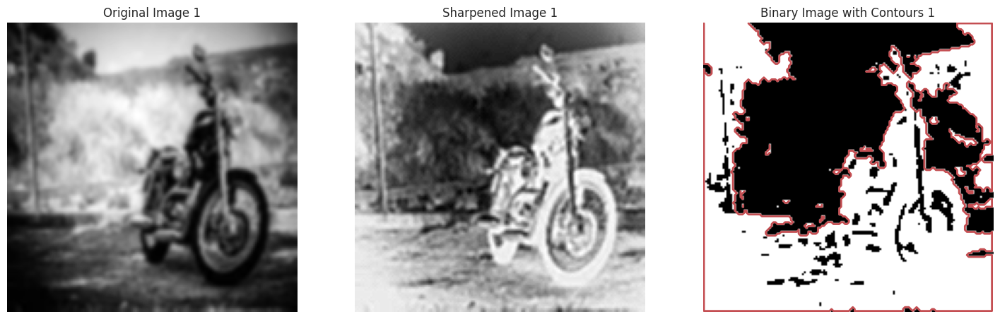

Processing images:   0%|          | 1/8000 [00:00<1:40:04,  1.33it/s]

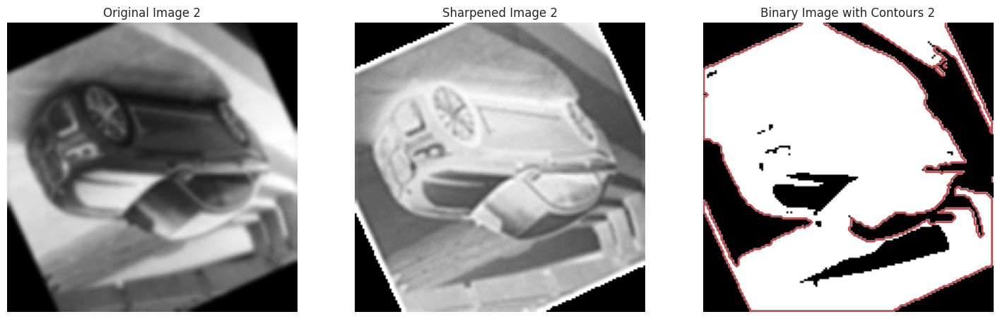

Processing images:   0%|          | 2/8000 [00:01<1:36:59,  1.37it/s]

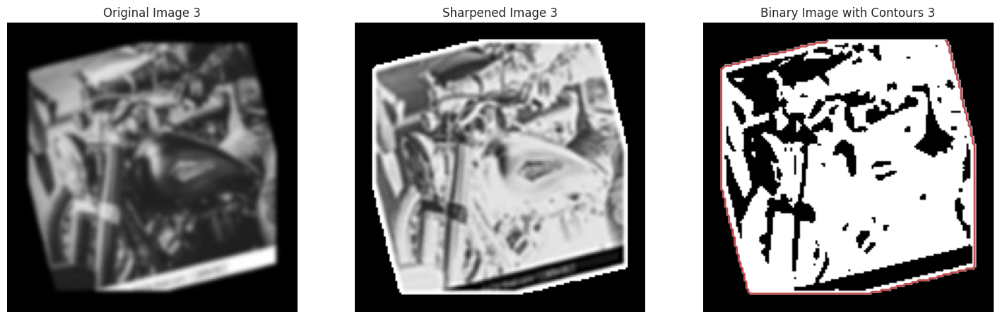

Processing images:   0%|          | 3/8000 [00:02<2:12:25,  1.01it/s]

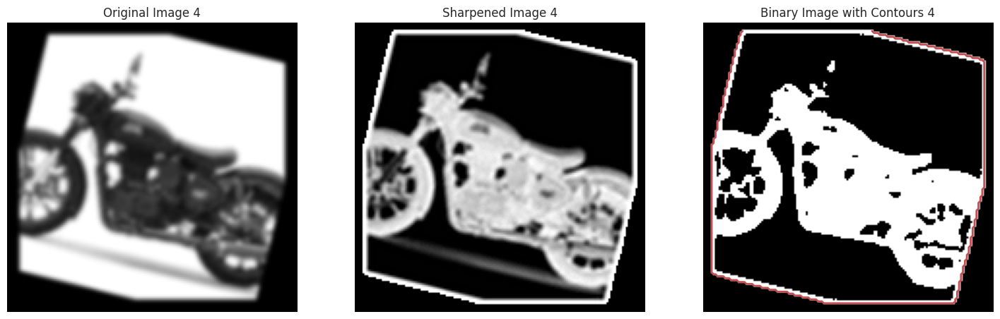

Processing images:   0%|          | 4/8000 [00:03<1:55:00,  1.16it/s]

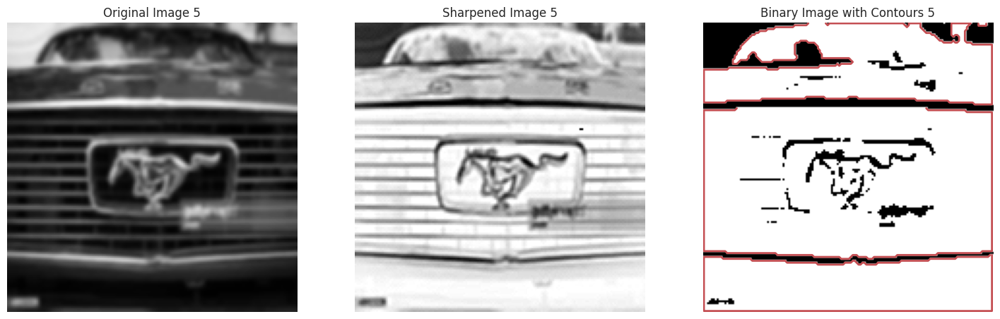

Processing images:   0%|          | 5/8000 [00:04<1:46:59,  1.25it/s]

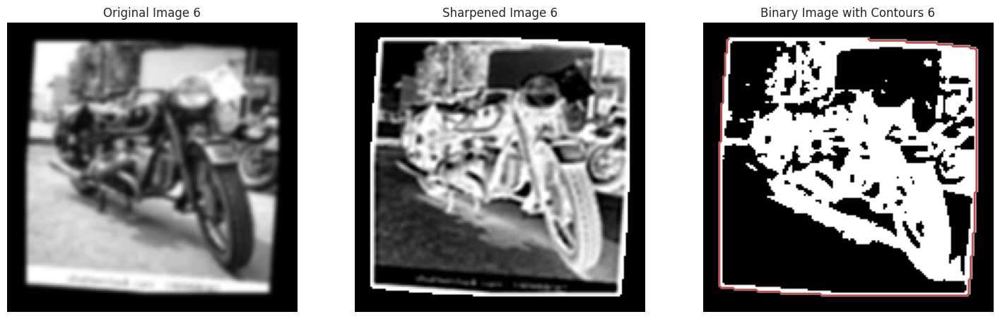

Processing images:   0%|          | 6/8000 [00:04<1:42:06,  1.30it/s]

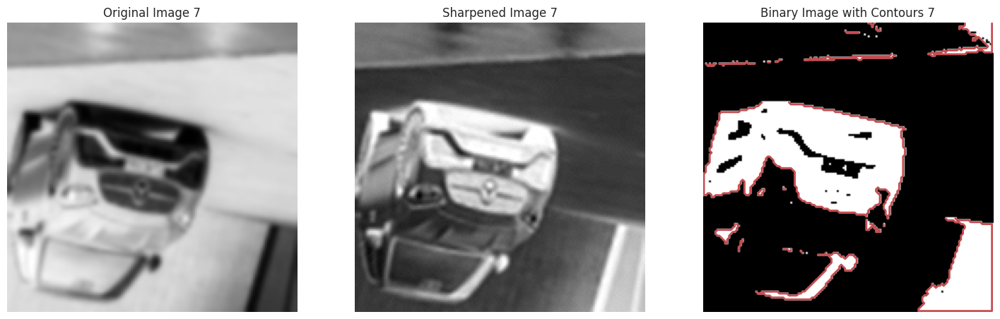

Processing images:   0%|          | 7/8000 [00:05<1:39:24,  1.34it/s]

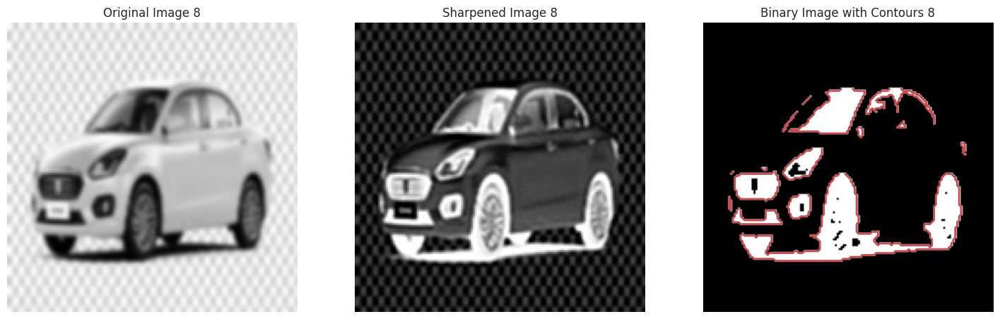

Processing images:   0%|          | 8/8000 [00:06<1:38:15,  1.36it/s]

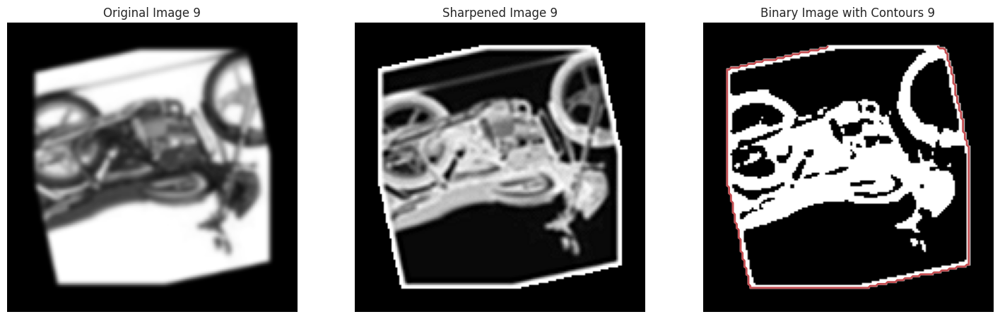

Processing images:   0%|          | 9/8000 [00:06<1:35:31,  1.39it/s]

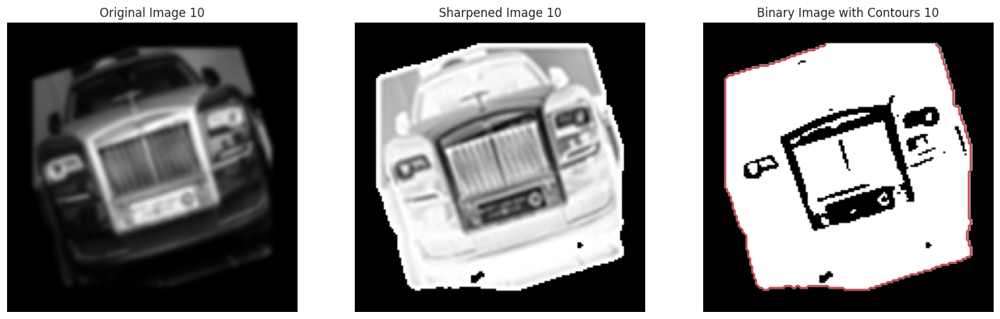

Processing images: 100%|██████████| 8000/8000 [00:18<00:00, 426.90it/s]

Feature Extraction: 8000


In [105]:
# List to store extracted chain code features
extracted_features = []
images_feature = []

# Chain code directions (4-connectivity or 8-connectivity)
chain_code_direction_8 = {
    (0, 1): 0,  # Right
    (-1, 1): 1,  # Upper-right
    (-1, 0): 2,  # Up
    (-1, -1): 3,  # Upper-left
    (0, -1): 4,  # Left
    (1, -1): 5,  # Lower-left
    (1, 0): 6,  # Down
    (1, 1): 7   # Lower-right
}

# Sharpening filter kernel
sharpening_kernel = np.array([[0, -1, 0],
                               [-1, 5,-1],
                               [0, -1, 0]])

# Number of sample images to display
num_samples_to_show = 10

# Variable to track the maximum length of chain codes across all images
max_chain_code_length = 0

# First pass through images to determine max_chain_code_length
for idx, img in enumerate(tqdm(train_imgs, desc="Processing images")):
    if len(img.shape) == 2:  # Grayscale image
        gray_img = img
    else:  # RGB image
        gray_img = color.rgb2gray(img)
    
    # Normalize gray image to 0-255 and convert to uint8
    gray_img = (gray_img * 255).astype(np.uint8)
    
    # Apply sharpening filter
    sharpened_img = cv2.filter2D(gray_img, -1, sharpening_kernel)
    
    # Threshold the image to binary
    _, binary_img = cv2.threshold(sharpened_img, 128, 255, cv2.THRESH_BINARY)
    
    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Only process if there are contours
    if contours:
        chain_codes = []
        
        # Select the largest contour
        contour = max(contours, key=cv2.contourArea)
        
        # Iterate through contour points to compute the chain code
        for i in range(1, len(contour)):
            # Get the current point and the previous point
            prev_point = contour[i-1][0]
            curr_point = contour[i][0]
            
            # Compute the difference in x and y
            dx = curr_point[0] - prev_point[0]
            dy = curr_point[1] - prev_point[1]
            
            # Get the chain code direction for the (dx, dy) movement
            direction = chain_code_direction_8.get((dy, dx))
            if direction is not None:
                chain_codes.append(direction)
        
        # Track the maximum length of chain codes
        max_chain_code_length = max(max_chain_code_length, len(chain_codes))
        
# Second pass through images to pad chain codes
for idx, img in enumerate(tqdm(train_imgs, desc="Processing images")):
    if len(img.shape) == 2:  # Grayscale image
        gray_img = img
    else:  # RGB image
        gray_img = color.rgb2gray(img)
    
    # Normalize gray image to 0-255 and convert to uint8
    gray_img = (gray_img * 255).astype(np.uint8)
    
    # Apply sharpening filter
    sharpened_img = cv2.filter2D(gray_img, -1, sharpening_kernel)
    
    # Threshold the image to binary
    _, binary_img = cv2.threshold(sharpened_img, 128, 255, cv2.THRESH_BINARY)
    
    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Only process if there are contours
    if contours:
        chain_codes = []
        
        # Select the largest contour
        contour = max(contours, key=cv2.contourArea)
        
        # Iterate through contour points to compute the chain code
        for i in range(1, len(contour)):
            # Get the current point and the previous point
            prev_point = contour[i-1][0]
            curr_point = contour[i][0]
            
            # Compute the difference in x and y
            dx = curr_point[0] - prev_point[0]
            dy = curr_point[1] - prev_point[1]
            
            # Get the chain code direction for the (dx, dy) movement
            direction = chain_code_direction_8.get((dy, dx))
            if direction is not None:
                chain_codes.append(direction)
        
        # Pad the chain code sequence to the max length
        padded_chain_code = chain_codes + [0] * (max_chain_code_length - len(chain_codes))
        
        # Append the padded chain code to the feature list
        images_feature.append(np.array(padded_chain_code).flatten())
    
    # Visualization (only for first num_samples_to_show images)
    if idx < num_samples_to_show:
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        ax[0].imshow(img, cmap='gray')
        ax[0].set_title(f'Original Image {idx+1}')
        ax[0].axis('off')
        
        ax[1].imshow(sharpened_img, cmap='gray')
        ax[1].set_title(f'Sharpened Image {idx+1}')
        ax[1].axis('off')
        
        ax[2].imshow(binary_img, cmap='gray')
        ax[2].set_title(f'Binary Image with Contours {idx+1}')
        for contour in contours:
            ax[2].plot(contour[:, 0, 0], contour[:, 0, 1], 'r-', lw=2)  # Plot contour
        ax[2].axis('off')
        
        plt.show()

# Convert features to a NumPy array
images_feature = np.array(images_feature)
print(f'Feature Extraction: {len(images_feature)}')


# Split the data

In [107]:
x_train, x_test, y_train, y_test = train_test_split(images_feature, train_labels, train_size=0.75, random_state=64)

print(f'Shape of Training Data: {x_train.shape}')
print(f'Shape of Testing Data: {x_test.shape}')

Shape of Training Data: (6000, 730)
Shape of Testing Data: (2000, 730)


In [108]:
x_train[0]

array([5, 5, 5, 4, 5, 5, 5, 7, 5, 0, 3, 1, 2, 3, 1, 0, 7, 1, 0, 1, 0, 4,
       3, 1, 7, 2, 1, 2, 1, 7, 7, 1, 0, 7, 4, 4, 6, 5, 0, 1, 0, 1, 0, 1,
       5, 5, 5, 6, 4, 5, 4, 5, 3, 2, 1, 0, 1, 5, 4, 5, 5, 4, 5, 4, 5, 4,
       4, 4, 6, 7, 1, 0, 1, 1, 0, 1, 0, 1, 0, 7, 7, 7, 7, 5, 4, 5, 4, 5,
       5, 4, 6, 5, 6, 5, 5, 7, 6, 7, 6, 0, 7, 7, 0, 0, 0, 7, 4, 3, 4, 3,
       4, 2, 1, 7, 0, 1, 7, 1, 0, 0, 7, 7, 7, 5, 4, 5, 4, 6, 1, 1, 1, 0,
       7, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 2, 1, 0, 4, 6, 5, 6, 4, 3, 1,
       3, 1, 2, 3, 3, 3, 3, 3, 3, 2, 3, 2, 3, 3, 2, 3, 2, 3, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 3, 3, 3, 5, 4, 3, 5, 3, 4, 5, 3, 5, 3, 5, 3,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

# Model training

## RandomForestClassifier Model(Chain)

In [87]:
# Random Forest
RandomForest = RandomForestClassifier(n_estimators=170, min_samples_split=3, min_samples_leaf=4, max_depth=15)

RandomForest.fit(x_train, y_train)

RandomForestClassifier(max_depth=15, min_samples_leaf=4, min_samples_split=3,
                       n_estimators=170)

In [88]:
# make cross validation
cross_validation = cross_val_score(estimator=RandomForest, X=x_train, y=y_train, scoring="balanced_accuracy",
                                  cv=5, n_jobs=-1)
print(f"The Scores is ==> {cross_validation}")
print("--"*50)
print(f"The Mean Of The Scores is ==> {cross_validation.mean()}")

print("**"*50)

# make cross validation to predict
cross_validation_pred = cross_val_predict(estimator=RandomForest, X=x_train, y=y_train, method="predict",
                                         cv=5, n_jobs=-1)

The Scores is ==> [0.62496562 0.59017309 0.6194442  0.59655985 0.62421108]
----------------------------------------------------------------------------------------------------
The Mean Of The Scores is ==> 0.6110707664946317
****************************************************************************************************


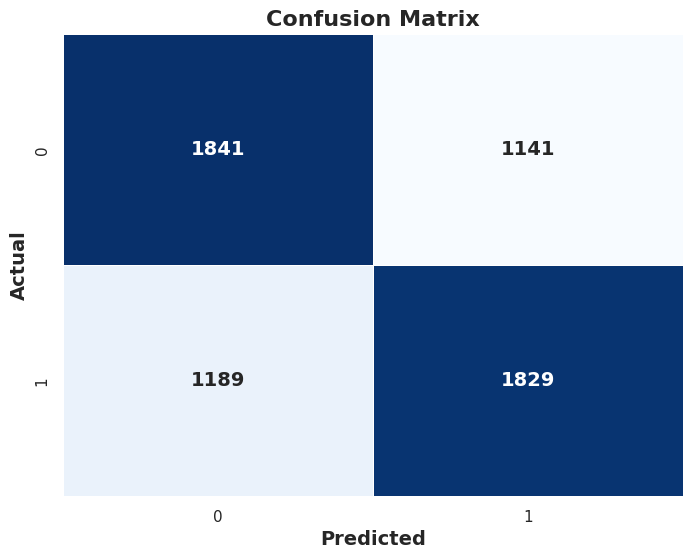

In [89]:
# Compute the confusion matrix
confusion = confusion_matrix(y_train, cross_validation_pred)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)
# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [90]:
# make prediction
y_pred_RandomForest = RandomForest.predict(x_test)
y_pred_RandomForest

array([1, 0, 1, ..., 1, 0, 1])

In [91]:
# prediction
pd.DataFrame(np.c_[y_pred_RandomForest, y_test], columns=["prediction", "Actual"])

,prediction,Actual
0,1,1
1,0,0
2,1,1
3,1,1
4,0,0
...,...,...
1995,0,0
1996,1,1
1997,1,1
1998,0,0


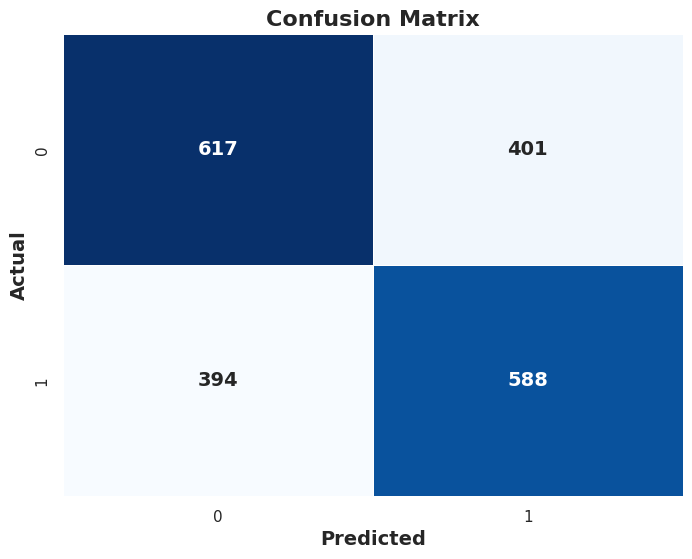

In [92]:
# Compute the confusion matrix on the test
confusion = confusion_matrix(y_test, y_pred_RandomForest)

# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [93]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(y_test, y_pred_RandomForest)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.61      0.61      0.61      1018
           1       0.59      0.60      0.60       982

    accuracy                           0.60      2000
   macro avg       0.60      0.60      0.60      2000
weighted avg       0.60      0.60      0.60      2000



In [94]:
# the scores
print(f"The Score On The Train => {RandomForest.score(x_train, y_train)*100:0.2f} %")
print(f"The Score On The Test => {RandomForest.score(x_test, y_test)*100:0.2f} %")

The Score On The Train => 90.58 %
The Score On The Test => 60.25 %


In [95]:
import pickle
# Save the model to a file using pickle
with open("RandomForestModel(Chain).pkl", "wb") as f:
    pickle.dump(RandomForest, f)

# Deep Learning Model (Chain)

In [109]:
# Create Model
input_shape = (730,)
model = Sequential()

model.add(layers.InputLayer(input_shape=input_shape))

model.add(layers.Dense(1024, activation='relu'))  
model.add(layers.Dropout(0.2))  
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dropout(0.2))
model.add(layers.Dense(32, activation='relu'))
model.add(layers.Dropout(0.1))
model.add(layers.Dense(16, activation='relu'))

model.add(layers.Dense(2, activation='softmax'))

model.compile(optimizer='adam', 
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 1024)           │       748,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 7)              │           119 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,448,551 (5.53 MB)

 Trainable params: 1,448,551 (5.53 MB)

 Non-trainable params: 0 (0.00 B)

In [110]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the model checkpoint callback
checkpoint = ModelCheckpoint(
    "best_model(Chain1).h5.keras",            # Filepath where the model is saved
    monitor='val_loss',         # Monitor validation loss
    save_best_only=True,        # Save only the model with the best performance
    mode='min',                 # Save when 'val_loss' decreases (minimization)
    verbose=1                   # Verbosity mode, to display when a model is saved
)

# Train the model with the checkpoint callback
history = model.fit(
    x_train, y_train,
    epochs=100,
    batch_size=32,
    validation_data=(x_test, y_test),
    callbacks=[checkpoint]       
)


Epoch 1/100
185/188 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5220 - loss: 0.8956
Epoch 1: val_loss improved from inf to 0.67783, saving model to best_model(Chain1).h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - accuracy: 0.5223 - loss: 0.8931 - val_accuracy: 0.5805 - val_loss: 0.6778
Epoch 2/100
185/188 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5600 - loss: 0.6970
Epoch 2: val_loss improved from 0.67783 to 0.67113, saving model to best_model(Chain1).h5.keras
188/188 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.5601 - loss: 0.6970 - val_accuracy: 0.6010 - val_loss: 0.6711
Epoch 3/100
188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5730 - loss: 0.6839
Epoch 3: val_loss did not improve from 0.67113
188/188 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.5730 - loss: 0.6840 - val_accuracy: 0.5925 - val_loss: 0.6799
Epoch 4/100
185/188 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.5649 - loss: 0.6861
Epoch 4: val_loss did not improve from 0.67113
188/188 ━━━━

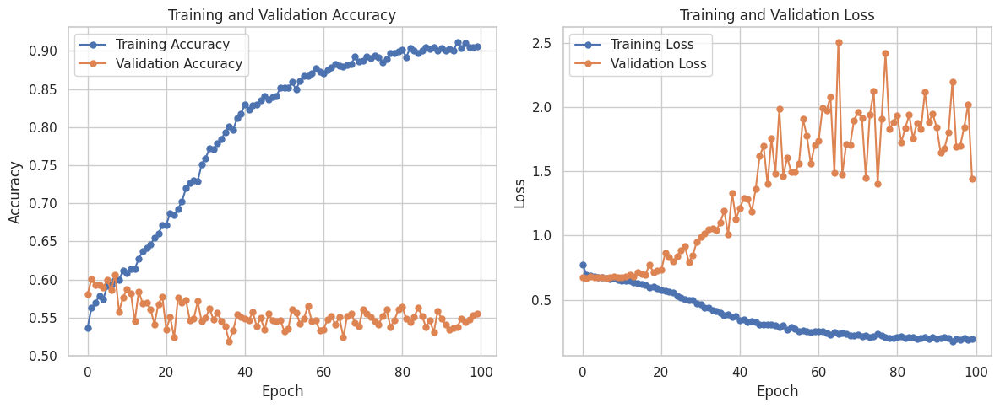

In [111]:
# The style
sns.set(style='whitegrid')

# Plotting training history
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy', linestyle='-', marker='o', markersize=5)
plt.plot(history.history['val_accuracy'], label='Validation Accuracy', linestyle='-', marker='o', markersize=5)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss', linestyle='-', marker='o', markersize=5)
plt.plot(history.history['val_loss'], label='Validation Loss', linestyle='-', marker='o', markersize=5)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [112]:
# use the best model
from tensorflow.keras.models import load_model

# Load the saved model from the file
best_model = load_model('/kaggle/working/best_model(Chain1).h5.keras')

predictions = best_model.predict(x_test)



63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


In [113]:
# Evaluate the model on the test set
loss, accuracy = best_model.evaluate(x_test, y_test)
print(f"Test Accuracy: {accuracy*100:.2f}%")
print(f"Test Loss: {loss*100:.2f}%")

63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6025 - loss: 0.6699
Test Accuracy: 60.10%
Test Loss: 67.11%


In [114]:
the_predictions = []
for i in range(len(predictions)):
    the_predictions.append(np.argmax(predictions[i]))
print(the_predictions[:20])

[1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0]


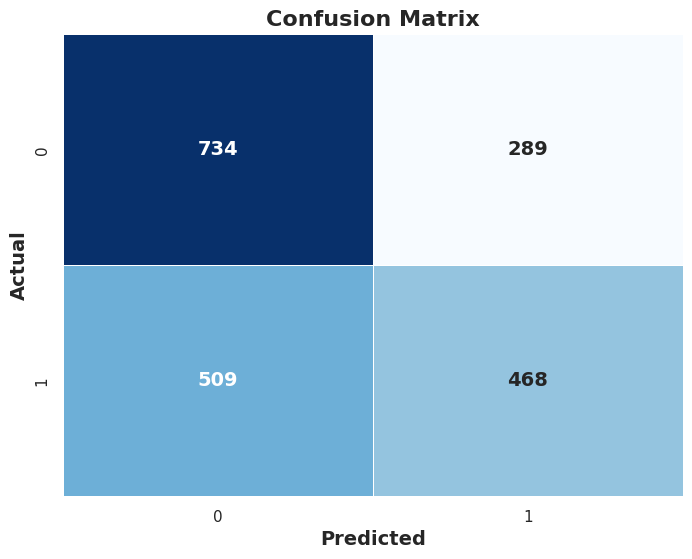

In [115]:
# Compute the confusion matrix
confusion = confusion_matrix(y_test, the_predictions)
# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False,
            annot_kws={'size': 14, 'weight': 'bold'}, linewidths=.5)

# Customize labels and title
plt.xlabel('Predicted', fontsize=14, fontweight='bold')
plt.ylabel('Actual', fontsize=14, fontweight='bold')
plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
plt.show()

In [116]:
print("\033[1mThe Classification Report on Test Data\033[0m\n")
classification_rep = classification_report(y_test, the_predictions)
print(classification_rep)

The Classification Report on Test Data

              precision    recall  f1-score   support

           0       0.59      0.72      0.65      1023
           1       0.62      0.48      0.54       977

    accuracy                           0.60      2000
   macro avg       0.60      0.60      0.59      2000
weighted avg       0.60      0.60      0.60      2000

